<a href="https://colab.research.google.com/github/ReemOoka/audio_emotion_recognition/blob/main/Audio_Emotion_Recognition_%2B_SER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Environment Setup and Library Imports**
This cell installs necessary packages and imports all required libraries for data handling, audio processing, model building, and evaluation. It includes tools like TensorFlow, Librosa, pydub, and scikit-learn, along with visualization libraries such as Matplotlib, Seaborn, and Plotly.



In [ ]:
# Install required packages.
!pip install tensorflow
!pip install antropy
!pip install pydub

# Standard libraries
import os
import warnings
import numpy as np
import pandas as pd
import pickle
from statistics import mode

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import IPython
import plotly.express as px
import plotly.graph_objects as go

# Audio processing libraries
import librosa
import librosa.display
from pydub import AudioSegment
from pydub.silence import split_on_silence

# Additional specialized libraries
from antropy import spectral_entropy

# Keras & TensorFlow utilities (using TensorFlow's bundled Keras)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model

# Scikit-learn for preprocessing and model evaluation
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix,
                             f1_score, multilabel_confusion_matrix, precision_score, recall_score)
from sklearn.model_selection import train_test_split

# Progress bar
from tqdm.auto import tqdm

# Ignore warnings
warnings.filterwarnings('ignore')


#1. Inspect and Explore Data

### 1.1 **Mount Drive & Extract Emotion Datasets**

This section mounts your Google Drive, creates a local input folder, and extracts four emotion recognition datasets (RAVDESS, CREMA-D, SAVEE, TESS) from Drive into your Colab workspace. It also sets the paths for each dataset for easy access later.

In [ ]:
# 1. Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Create a local directory for the datasets
!mkdir -p /content/input

# 3. Unzip the datasets from your Drive.
# Adjust the file names as needed if they differ.
!unzip -o "/content/drive/My Drive/Datasets/RAVDESS.zip" -d /content/input/ravdessemotionalspeechaudio
!unzip -o "/content/drive/My Drive/Datasets/CREMA-D.zip" -d /content/input/cremad
!unzip -o "/content/drive/My Drive/Datasets/SAVEE.zip" -d /content/input/surrey-audiovisual-expressed-emotion-savee
!unzip -o "/content/drive/My Drive/Datasets/TESS.zip" -d /content/input/torontoemotionalspeechsettess

# 4. Set the dataset paths based on the extracted folder structure.
RAVDESS_PATH = '/content/input/ravdessemotionalspeechaudio'
# For CREMAD, if the audio files are inside a subfolder (e.g., AudioWAV), update accordingly.
CREMAD_PATH  = '/content/input/cremad/AudioWAV/'
SAVEE_PATH   = '/content/input/surrey-audiovisual-expressed-emotion-savee/ALL/'
TESS_PATH    = '/content/input/torontoemotionalspeechsettess'

print("Dataset Paths:")
print("RAVDESS_PATH:", RAVDESS_PATH)
print("CREMAD_PATH:", CREMAD_PATH)
print("SAVEE_PATH:", SAVEE_PATH)
print("TESS_PATH:", TESS_PATH)

Streaming output truncated to the last 5000 lines.
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_beg_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_bite_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_boat_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_bone_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_book_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_bought_angry.wav  
  inflating: /content/input/torontoemotionalspeechsettess/TESS Toronto emotional speech set data/OAF_angry/OAF_burn_angry.wav  
  inflating: /content/input/torontoemotionalspeechse

1.3 Prepare the Data of the RAVDESS Dataset

### **Parse RAVDESS Dataset and Create DataFrame**
This block reads all .wav files from the RAVDESS dataset, extracts emotion labels, gender (based on actor ID), and file paths. It builds a structured DataFrame and maps numeric emotion codes to their textual labels for easier interpretation and use.

In [ ]:
# Access inner directories (each representing an actor)
ravdess_dir_list = [x for x in os.listdir(RAVDESS_PATH) if not x.startswith('.')]
print('Ravdess directories:\n', sorted(ravdess_dir_list))

# Create lists for dataframe columns.
emotion = []
gender = []
location = []

# Iterate over inner folders.
for actor_file in ravdess_dir_list:
    actor_path = os.path.join(RAVDESS_PATH, actor_file)
    # Get only .wav files and skip hidden files.
    actor_wavs = [x for x in os.listdir(actor_path) if not x.startswith('.') and x.endswith('.wav')]

    for wav in actor_wavs:
        partition = wav.split('-')
        # Check if filename follows the expected pattern.
        if len(partition) < 7:
            print(f"Skipping file {wav} because it does not have enough parts: {partition}")
            continue

        try:
            emotion_num = int(partition[2])
        except ValueError:
            print(f"Skipping file {wav} because partition[2] is not an integer: {partition[2]}")
            continue

        emotion.append(emotion_num)

        try:
            # The actor number is expected as the 7th part, e.g. "actorID.wav"
            actor_num = int(partition[6].split('.')[0])
        except ValueError:
            print(f"Skipping file {wav} because actor number cannot be parsed: {partition[6]}")
            continue

        # Even actor numbers denote 'female' and odd denote 'male'.
        if (actor_num % 2 == 0):
            gender.append('female')
        else:
            gender.append('male')

        location.append(os.path.join(actor_path, wav))

# Initialize dataframe.
ravdess_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location},
                          columns=['gender', 'emotion', 'location'])

# Map numerical emotion labels to text labels.
ravdess_df = ravdess_df.replace({"emotion": {
    1: 'neutral', 2: 'calm', 3: 'happy', 4: 'sad',
    5: 'angry', 6: 'fear', 7: 'disgust', 8: 'surprise'
}})

print('ravdess_df.shape =', ravdess_df.shape, '\n')
print('Unique emotions =', sorted(ravdess_df['emotion'].unique()), '\n')
print('# of Unique emotions =', len(ravdess_df['emotion'].unique()), '\n')
print(ravdess_df.emotion.value_counts(), '\n')
ravdess_df

Ravdess directories:
 ['Actor_01', 'Actor_02', 'Actor_03', 'Actor_04', 'Actor_05', 'Actor_06', 'Actor_07', 'Actor_08', 'Actor_09', 'Actor_10', 'Actor_11', 'Actor_12', 'Actor_13', 'Actor_14', 'Actor_15', 'Actor_16', 'Actor_17', 'Actor_18', 'Actor_19', 'Actor_20', 'Actor_21', 'Actor_22', 'Actor_23', 'Actor_24', 'audio_speech_actors_01-24']
ravdess_df.shape = (1440, 3) 

Unique emotions = ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions = 8 

emotion
calm        192
surprise    192
disgust     192
happy       192
angry       192
sad         192
fear        192
neutral      96
Name: count, dtype: int64 



,gender,emotion,location
0,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
1,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
2,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
3,female,disgust,/content/input/ravdessemotionalspeechaudio/Act...
4,female,neutral,/content/input/ravdessemotionalspeechaudio/Act...
...,...,...,...
1435,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
1436,female,fear,/content/input/ravdessemotionalspeechaudio/Act...
1437,female,happy,/content/input/ravdessemotionalspeechaudio/Act...
1438,female,angry,/content/input/ravdessemotionalspeechaudio/Act...


1.4 Prepare the Data of the CREMA-D Dataset

### **Upload and Process CREMA-D Demographics and Audio Data**
This section uploads and reads the VideoDemographics.csv file to map actor IDs to their gender, then parses all .wav files in the CREMA-D dataset. It extracts emotion, intensity, actor ID, and gender information, and creates a structured DataFrame with descriptive emotion labels.



In [ ]:
# --- Upload and Process VideoDemographics.csv ---

from google.colab import files
import io
import pandas as pd
import os

# Step 1: Upload your VideoDemographics.csv file manually.
uploaded = files.upload()  # When prompted, select your VideoDemographics.csv file.
csv_filename = list(uploaded.keys())[0]
print("Uploaded file:", csv_filename)

# Step 2: Read the CSV file.
Crema_genders = pd.read_csv(io.BytesIO(uploaded[csv_filename]))

# Select only the columns with actor IDs and genders.
select_cond = ['ActorID', 'Sex']
extraction = Crema_genders[select_cond]

# Create a dictionary mapping actor IDs to their gender.
extraction_dict = dict(extraction.values)
print("Created demographics dictionary:", extraction_dict)

# --- Processing the CREMA Dataset using the CSV Dictionary ---

# Set the path to your CREMA audio files.
# Adjust this path according to your file structure.
CREMAD_PATH = '/content/input/cremad/AudioWAV/'

# Check that the CREMA directory exists.
if not os.path.exists(CREMAD_PATH):
    print("Error: Directory does not exist:", CREMAD_PATH)
    print("Available directories in /content/input/cremad:")
    print(os.listdir('/content/input/cremad'))
else:
    # Initialize lists to hold data.
    emotion = []
    intensity = []
    gender = []
    location = []

    # List only .wav files in the CREMA directory.
    wavs = [x for x in os.listdir(CREMAD_PATH) if not x.startswith('.') and x.endswith('.wav')]

    for wav in wavs:
        partition = wav.split('_')
        if len(partition) < 4:
            print(f"Skipping file {wav} due to unexpected format.")
            continue

        # Extract emotion and intensity from the filename.
        emotion_ = partition[2]
        intensity_ = partition[3].split('.')[0]

        # Extract actor_ID (assumed to be the first part of the filename).
        try:
            actor_ID = int(partition[0])
        except ValueError:
            print(f"Skipping file {wav} because actor_ID is not an integer: {partition[0]}")
            continue

        # Lookup the gender using the CSV dictionary.
        if actor_ID in extraction_dict:
            gender.append(extraction_dict[actor_ID])
        else:
            gender.append('unknown')

        emotion.append(emotion_)
        intensity.append(intensity_)
        location.append(os.path.join(CREMAD_PATH, wav))

    # Create the DataFrame for the CREMA dataset.
    crema_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location},
                            columns=['gender', 'emotion', 'location'])

    # Replace emotion abbreviations with full descriptive labels.
    crema_df = crema_df.replace({'emotion': {
        'ANG': 'angry', 'DIS': 'disgust',
        'FEA': 'fear',  'HAP': 'happy',
        'NEU': 'neutral', 'SAD': 'sad'
    }})

    print('crema_df.shape =', crema_df.shape)
    print('Unique emotions =', sorted(crema_df['emotion'].unique()))
    print('Number of Unique emotions =', len(crema_df['emotion'].unique()))
    print(crema_df.emotion.value_counts())
    crema_df

Saving VideoDemographics.csv to VideoDemographics.csv
Uploaded file: VideoDemographics.csv
Created demographics dictionary: {1001: 'Male', 1002: 'Female', 1003: 'Female', 1004: 'Female', 1005: 'Male', 1006: 'Female', 1007: 'Female', 1008: 'Female', 1009: 'Female', 1010: 'Female', 1011: 'Male', 1012: 'Female', 1013: 'Female', 1014: 'Male', 1015: 'Male', 1016: 'Male', 1017: 'Male', 1018: 'Female', 1019: 'Male', 1020: 'Female', 1021: 'Female', 1022: 'Male', 1023: 'Male', 1024: 'Female', 1025: 'Female', 1026: 'Male', 1027: 'Male', 1028: 'Female', 1029: 'Female', 1030: 'Female', 1031: 'Male', 1032: 'Male', 1033: 'Male', 1034: 'Male', 1035: 'Male', 1036: 'Male', 1037: 'Female', 1038: 'Male', 1039: 'Male', 1040: 'Male', 1041: 'Male', 1042: 'Male', 1043: 'Female', 1044: 'Male', 1045: 'Male', 1046: 'Female', 1047: 'Female', 1048: 'Male', 1049: 'Female', 1050: 'Male', 1051: 'Male', 1052: 'Female', 1053: 'Female', 1054: 'Female', 1055: 'Female', 1056: 'Female', 1057: 'Male', 1058: 'Female', 1059:

1.5 Prepare the Data of the SAVEE Dataset

### **Process SAVEE Dataset and Extract Metadata**
This section parses the filenames in the SAVEE dataset to extract emotion labels, assigns gender (all male), and constructs a DataFrame containing file paths, gender, and emotion. Abbreviated emotion codes are mapped to their full descriptive names for consistency.



In [ ]:
location = []
gender = []
emotion = []

wavs = [x for x in os.listdir(SAVEE_PATH) if not x.startswith('.')]

for wav in wavs:
    partition = wav.split('_')
    emotion_ = partition[1].split('.')[0]
    emotion_ = ''.join(i for i in emotion_ if not i.isdigit())

    emotion.append(emotion_)
    gender.append('male')
    location.append(SAVEE_PATH + '/' + wav)

savee_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location},
                        columns=['gender','emotion','location'])

savee_df = savee_df.replace({'emotion': {'a':'angry','d': 'disgust','f': 'fear','h': 'happy',
                                         'n': 'neutral','sa': 'sad', 'su': 'surprise'}})
print('savee_df.shape=', savee_df.shape, '\n')
print('Unique emotions = ', sorted(savee_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(savee_df['emotion'].unique()), '\n')
print(savee_df.emotion.value_counts(), '\n')
savee_df

savee_df.shape= (480, 3) 

Unique emotions =  ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions =  7 

emotion
neutral     120
fear         60
angry        60
disgust      60
happy        60
sad          60
surprise     60
Name: count, dtype: int64 



,gender,emotion,location
0,male,fear,/content/input/surrey-audiovisual-expressed-em...
1,male,angry,/content/input/surrey-audiovisual-expressed-em...
2,male,fear,/content/input/surrey-audiovisual-expressed-em...
3,male,neutral,/content/input/surrey-audiovisual-expressed-em...
4,male,disgust,/content/input/surrey-audiovisual-expressed-em...
...,...,...,...
475,male,neutral,/content/input/surrey-audiovisual-expressed-em...
476,male,angry,/content/input/surrey-audiovisual-expressed-em...
477,male,neutral,/content/input/surrey-audiovisual-expressed-em...
478,male,disgust,/content/input/surrey-audiovisual-expressed-em...


1.6 Prepare the Data of the TESS Dataset

### **Process TESS Dataset and Extract Emotion Metadata**
This section recursively reads all .wav files from the TESS dataset, extracts emotion labels from folder or filename patterns, assigns the gender as female, and stores file paths. The result is a structured DataFrame ready for further processing or model training.



In [ ]:
import os
import pandas as pd

# Define the TESS dataset path.
TESS_PATH = '/content/input/torontoemotionalspeechsettess'

# Choose one folder from the duplicate folders.
selected_folder = "TESS Toronto emotional speech set data"
selected_path = os.path.join(TESS_PATH, selected_folder)
print("Processing files from folder:", selected_folder)

# Recursively collect all .wav files from the selected folder.
wav_files = []
for root, dirs, files in os.walk(selected_path):
    for file in files:
        if file.endswith('.wav'):
            wav_files.append(os.path.join(root, file))
print("Found", len(wav_files), "wav files in selected folder.")

# Initialize lists for DataFrame columns.
emotion_list = []
gender_list = []
location_list = []

# Process each wav file.
for filepath in wav_files:
    # Use the parent folder name to extract the emotion.
    parent_folder = os.path.basename(os.path.dirname(filepath))
    if parent_folder.startswith("YAF_") or parent_folder.startswith("OAF_"):
        raw_emotion = parent_folder.split('_', 1)[1].lower()
        # Map any variation with "pleasant" to "pleasant surprise".
        if "pleasant" in raw_emotion:
            em = "pleasant surprise"
        else:
            em = raw_emotion
    else:
        # Fallback: try to extract from the filename.
        filename = os.path.basename(filepath)
        parts = filename.split('_')
        if len(parts) >= 2:
            em = parts[1].split('.')[0].lower()
            if em == "ps":
                em = "pleasant surprise"
        else:
            em = ""
    emotion_list.append(em)
    gender_list.append('female')
    location_list.append(filepath)

# Create the DataFrame.
tess_df = pd.DataFrame({
    'gender': gender_list,
    'emotion': emotion_list,
    'location': location_list
})

print('tess_df.shape =', tess_df.shape, '\n')
print('Unique emotions =', sorted(tess_df['emotion'].unique()), '\n')
print('# of Unique emotions =', len(tess_df['emotion'].unique()), '\n')
print(tess_df['emotion'].value_counts(), '\n')
tess_df

Processing files from folder: TESS Toronto emotional speech set data
Found 2800 wav files in selected folder.
tess_df.shape = (2800, 3) 

Unique emotions = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'pleasant surprise', 'sad'] 

# of Unique emotions = 7 

emotion
happy                400
angry                400
sad                  400
neutral              400
fear                 400
disgust              400
pleasant surprise    400
Name: count, dtype: int64 



,gender,emotion,location
0,female,happy,/content/input/torontoemotionalspeechsettess/T...
1,female,happy,/content/input/torontoemotionalspeechsettess/T...
2,female,happy,/content/input/torontoemotionalspeechsettess/T...
3,female,happy,/content/input/torontoemotionalspeechsettess/T...
4,female,happy,/content/input/torontoemotionalspeechsettess/T...
...,...,...,...
2795,female,fear,/content/input/torontoemotionalspeechsettess/T...
2796,female,fear,/content/input/torontoemotionalspeechsettess/T...
2797,female,fear,/content/input/torontoemotionalspeechsettess/T...
2798,female,fear,/content/input/torontoemotionalspeechsettess/T...


1.7 Merge All Dataframes To One Dataframe

### **Combine All Datasets into a Single DataFrame**
This section merges the individual DataFrames from RAVDESS, CREMA-D, SAVEE, and TESS into one unified dataset. It then provides a summary of the dataset's shape, emotion distribution, and gender distribution for verification and analysis.



In [ ]:
combined_df = pd.concat([ravdess_df, crema_df, savee_df, tess_df],axis=0)

print('combined_df.shape=', combined_df.shape, '\n')

print('Unique emotions = ', sorted(combined_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(combined_df['emotion'].unique()), '\n')

print('Unique genders = ', combined_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(combined_df['gender'].unique()), '\n')

print(combined_df.emotion.value_counts(), '\n')

print(combined_df.gender.value_counts(), '\n')


combined_df

combined_df.shape= (12162, 3) 

Unique emotions =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'pleasant surprise', 'sad', 'surprise'] 

# of Unique emotions =  9 

Unique genders =  ['female' 'male' 'Male' 'Female'] 

# of Unique genders =  4 

emotion
disgust              1923
fear                 1923
happy                1923
angry                1923
sad                  1923
neutral              1703
pleasant surprise     400
surprise              252
calm                  192
Name: count, dtype: int64 

gender
Male      3930
female    3520
Female    3512
male      1200
Name: count, dtype: int64 



,gender,emotion,location
0,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
1,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
2,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
3,female,disgust,/content/input/ravdessemotionalspeechaudio/Act...
4,female,neutral,/content/input/ravdessemotionalspeechaudio/Act...
...,...,...,...
2795,female,fear,/content/input/torontoemotionalspeechsettess/T...
2796,female,fear,/content/input/torontoemotionalspeechsettess/T...
2797,female,fear,/content/input/torontoemotionalspeechsettess/T...
2798,female,fear,/content/input/torontoemotionalspeechsettess/T...


1.8 Replace Redundant Data

### **Clean and Standardize Emotion & Gender Labels**
This step ensures consistency in the dataset by normalizing gender and emotion labels (e.g., converting “Female” to “female” and “pleasant surprise” to “surprise”). It helps avoid duplication issues and ensures uniformity across the merged dataset.



In [ ]:
# Replace 'Female' with 'female'
combined_df['gender'] = combined_df['gender'].replace('Female', 'female')

# Replace 'Male' with 'male'
combined_df['gender'] = combined_df['gender'].replace('Male', 'male')

# Replace 'pleasant surprise' with 'surprise'
combined_df['emotion'] = combined_df['emotion'].replace('pleasant surprise', 'surprise')


print('combined_df.shape=', combined_df.shape, '\n')

print('Unique emotions = ', sorted(combined_df['emotion'].unique()), '\n')
print('# of Unique emotions = ', len(combined_df['emotion'].unique()), '\n')

print('Unique genders = ', combined_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(combined_df['gender'].unique()), '\n')

print(combined_df.emotion.value_counts(), '\n')

print(combined_df.gender.value_counts(), '\n')


combined_df

combined_df.shape= (12162, 3) 

Unique emotions =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

# of Unique emotions =  8 

Unique genders =  ['female' 'male'] 

# of Unique genders =  2 

emotion
disgust     1923
angry       1923
sad         1923
happy       1923
fear        1923
neutral     1703
surprise     652
calm         192
Name: count, dtype: int64 

gender
female    7032
male      5130
Name: count, dtype: int64 



,gender,emotion,location
0,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
1,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
2,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
3,female,disgust,/content/input/ravdessemotionalspeechaudio/Act...
4,female,neutral,/content/input/ravdessemotionalspeechaudio/Act...
...,...,...,...
2795,female,fear,/content/input/torontoemotionalspeechsettess/T...
2796,female,fear,/content/input/torontoemotionalspeechsettess/T...
2797,female,fear,/content/input/torontoemotionalspeechsettess/T...
2798,female,fear,/content/input/torontoemotionalspeechsettess/T...



1.9 Inspect / Remove NULL Values

### **Check for Missing Values in Combined Dataset**
This section checks for any missing (null) values in the combined dataset, both column-wise and overall. It helps ensure data quality before moving on to feature extraction or model training.

In [ ]:
print(combined_df.isnull().sum())
print()
print('combined_df.isnull().sum().sum() = ', combined_df.isnull().sum().sum())

gender      0
emotion     0
location    0
dtype: int64

combined_df.isnull().sum().sum() =  0


1.11 Print Out The Number Examples in Each Class (aka the class balances)

### **View Emotion Distribution (Counts & Proportions)**
This line displays the absolute and relative frequency of each emotion class in the combined dataset. It's useful for understanding class balance and preparing for model evaluation or stratified splitting.



In [ ]:
combined_df.emotion.value_counts(), combined_df.emotion.value_counts(normalize=True)

(emotion
 disgust     1923
 angry       1923
 sad         1923
 happy       1923
 fear        1923
 neutral     1703
 surprise     652
 calm         192
 Name: count, dtype: int64,
 emotion
 disgust     0.158115
 angry       0.158115
 sad         0.158115
 happy       0.158115
 fear        0.158115
 neutral     0.140026
 surprise    0.053610
 calm        0.015787
 Name: proportion, dtype: float64)

1.12 Print Out the Number of Unique Emotions

### **Extract Sorted List of Unique Emotion Classes**
This step extracts and sorts all unique emotion labels from the combined dataset. It ensures consistent ordering for encoding, model output interpretation, and evaluation.

In [ ]:
emotions_classes = sorted(combined_df['emotion'].unique())
print(emotions_classes)

['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


1.13 Pie Chart Of Unique Emotions

### **Visualize Emotion Class Distribution with Pie Chart**
This section creates a pie chart to visualize the distribution of emotion classes in the combined dataset. It helps assess class balance at a glance and supports decisions on data augmentation or stratified sampling.



In [ ]:
combined_df['emotion'].value_counts()

labels = combined_df['emotion'].value_counts().index
values = combined_df['emotion'].value_counts().values
colors=['#636efa', '#ef553b', '#00cc96', '#ab63fa', '#ffa15a', '#19d3f3', '#ff6692', '#b5e87f']

fig = go.Figure(data=[go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])

fig.update_layout(title='Emotion Classes Counts')
fig.show()


1.14 Pie Chart of the Unique Genders

### **Visualize Gender Distribution with Pie Chart**
This section generates a pie chart to display the proportion of male and female speakers in the dataset. It provides insight into gender representation, which may impact model bias or performance.



In [ ]:
combined_df['gender'].value_counts()

labels = combined_df['gender'].value_counts().index
values = combined_df['gender'].value_counts().values
colors = ['#ef553b', '#636efa']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])
fig.update_layout(title = 'Gender Classes Counts')
fig.show()

1.15 Set Color For Each Emotion

### **Assign Colors for Waveform Visualization by Emotion**
This color mapping is used to consistently style waveform plots based on emotion classes, making it easier to visually distinguish emotional patterns in audio signals.

In [ ]:
emotion_colors = {'surprise':'#ff6692',
                'neutral':'#19d3f3',
                'disgust':'#636efa',
                'fear':'#ef553b',
                'sad':'#ffa15a',
                'calm':'#b5e87f',
                'happy':'#00cc96',
                'angry':'#ab63fa'}

1.16 Wave Plot For Each Emotion

### **Plot Waveforms for Sample Audio Files by Emotion**
This section visualizes the waveform of one sample audio file from each emotion class. It uses librosa to display wave amplitude over time, colored by emotion for clearer differentiation of emotional speech patterns.



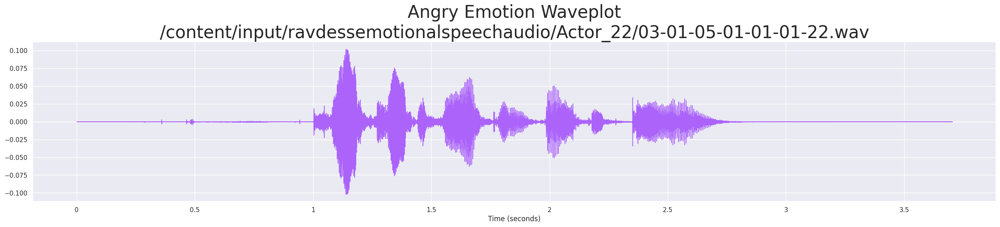

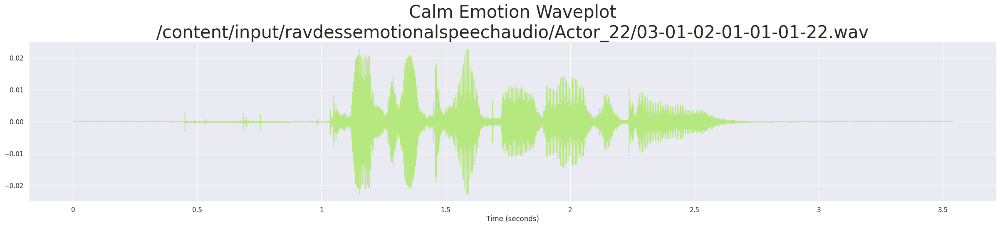

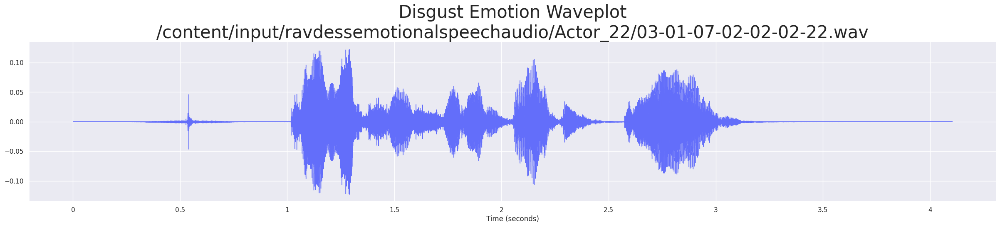

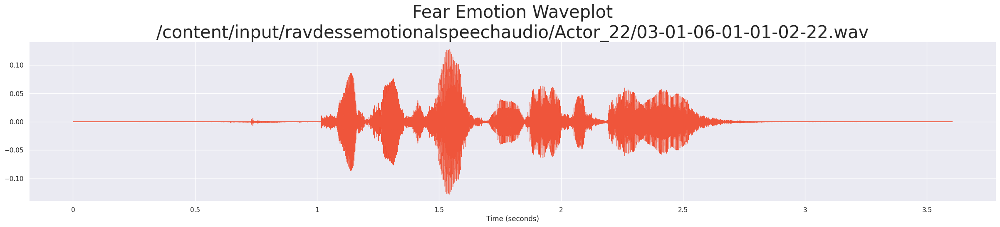

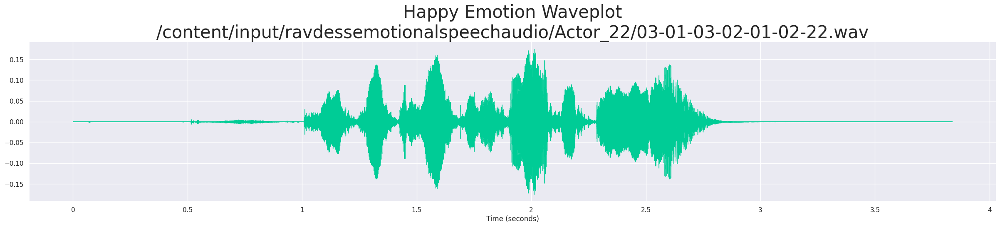

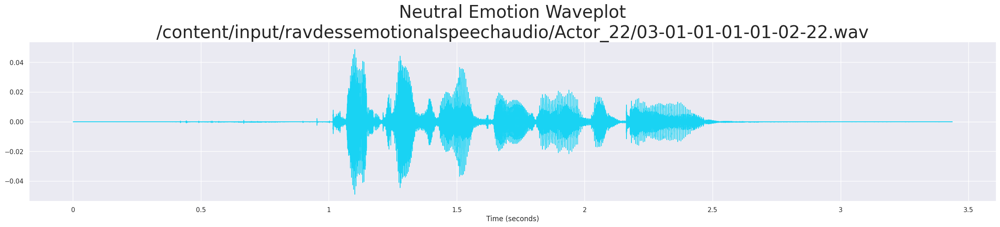

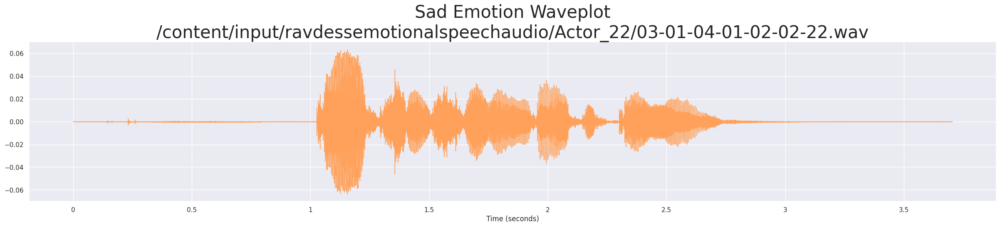

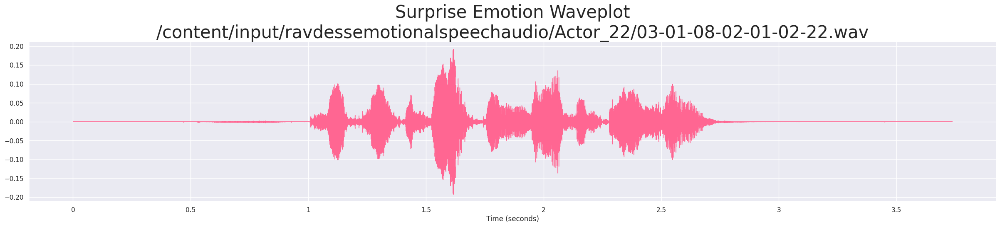

In [ ]:
def wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_color, file_path):
    plt.figure(figsize = (30, 5))
    librosa.display.waveshow(y = audio_time_series,sr = sampling_rate,color = emotion_color, x_axis = 's')
    plt.title(f'{emotion_class.capitalize()} Emotion Waveplot\n{file_path}', size = 30)


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series,sampling_rate = librosa.load(file_path)
    wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_colors[emotion_class], file_path)

1.17 Spectogram For Each Emotion

### **Visualize Spectrograms for Each Emotion Class**
This section generates spectrograms—visual representations of the frequency content over time—for one sample from each emotion class. It helps in analyzing how different emotions vary in their spectral energy and frequency distribution.



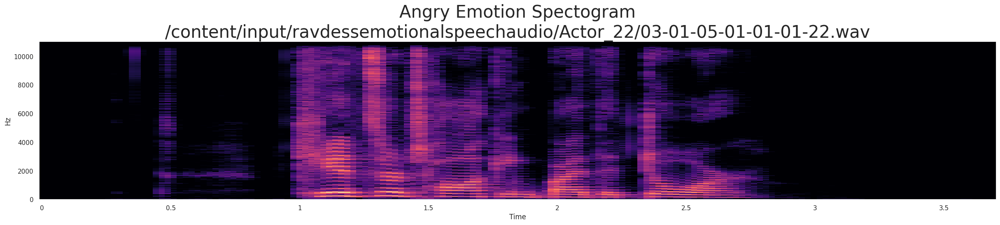

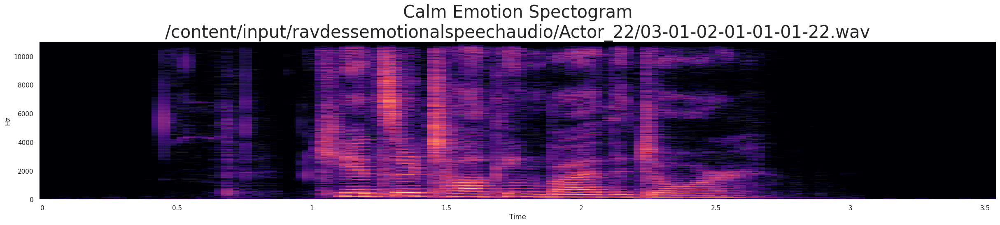

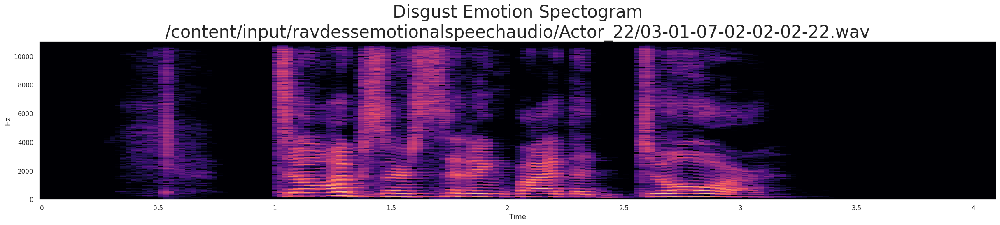

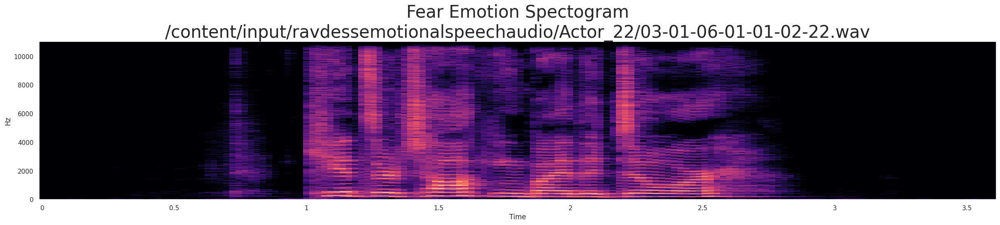

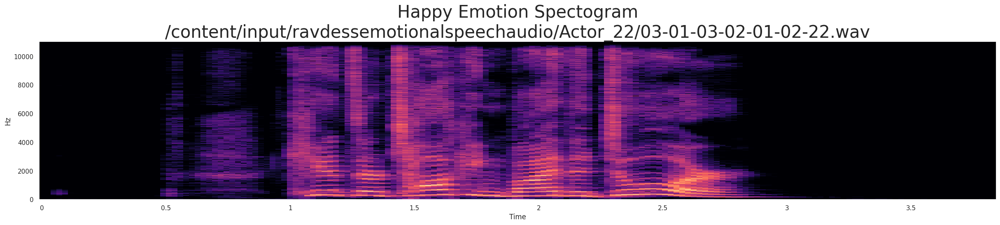

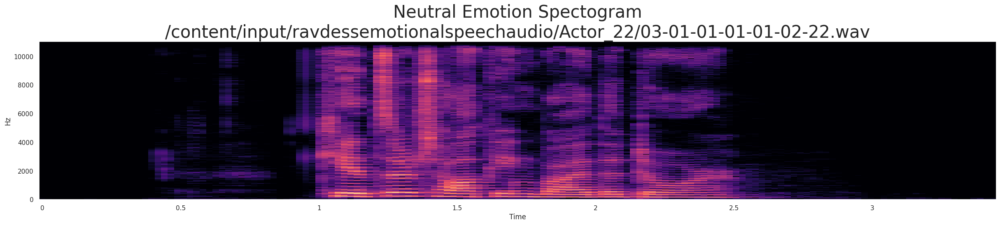

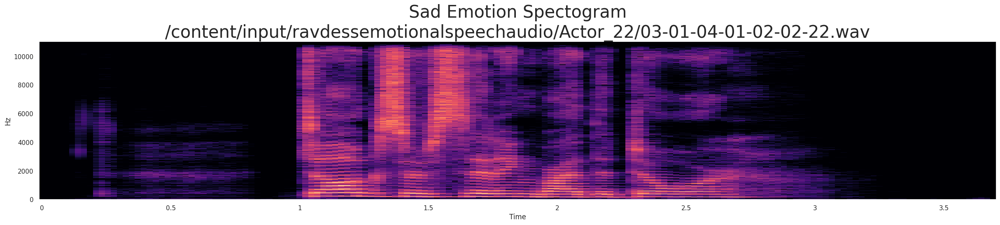

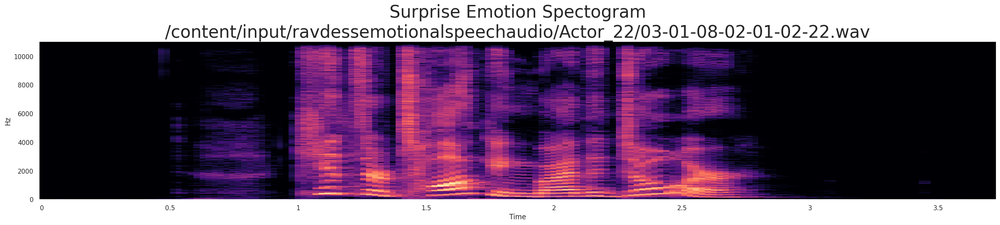

In [ ]:
def spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    audio = librosa.stft(audio_time_series)
    audio_db = librosa.amplitude_to_db(abs(audio))
    plt.figure(figsize = (30,5))
    plt.title(f'{emotion_class.capitalize()} Emotion Spectogram\n{file_path}',size = 30)
    librosa.display.specshow(audio_db, sr = sampling_rate, x_axis = 'time', y_axis = 'hz')


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    spectogram(audio_time_series, sampling_rate, emotion_class, file_path)

1.18 Mel Spectogram For Each Emotion

### **Visualize Mel Spectrograms for Each Emotion Class**
This section plots Mel spectrograms for one sample from each emotion class. Mel spectrograms emphasize perceptually relevant frequency ranges, making them useful for analyzing emotional tone in speech.



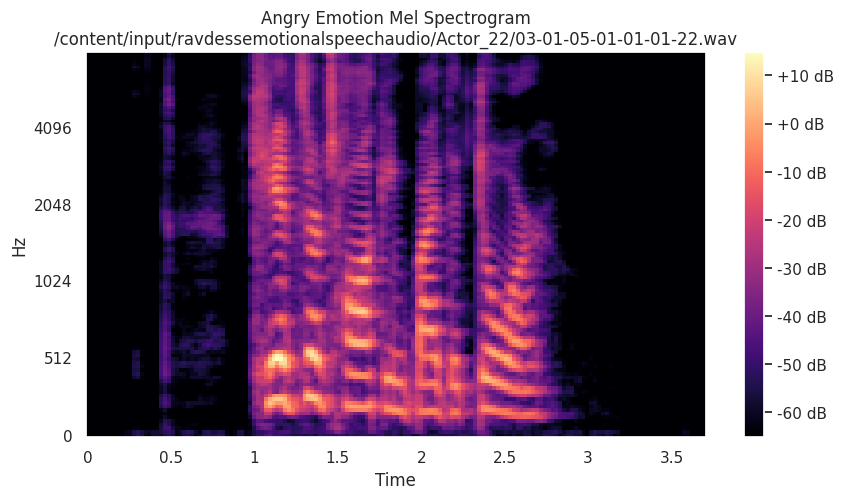

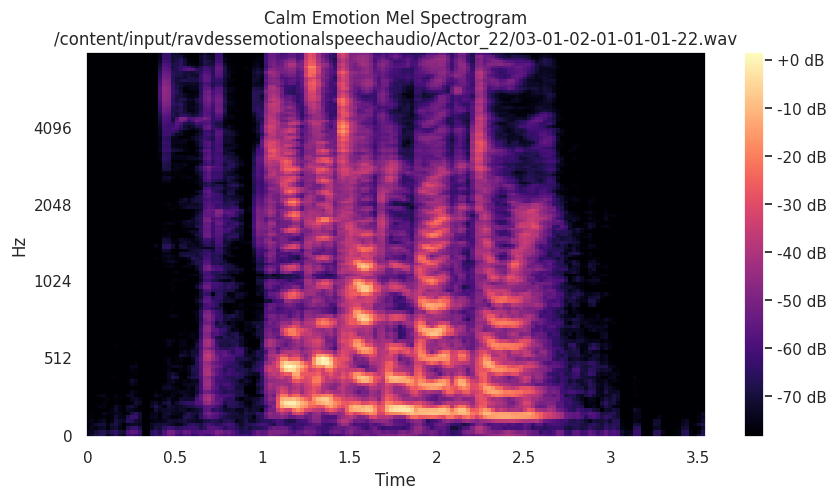

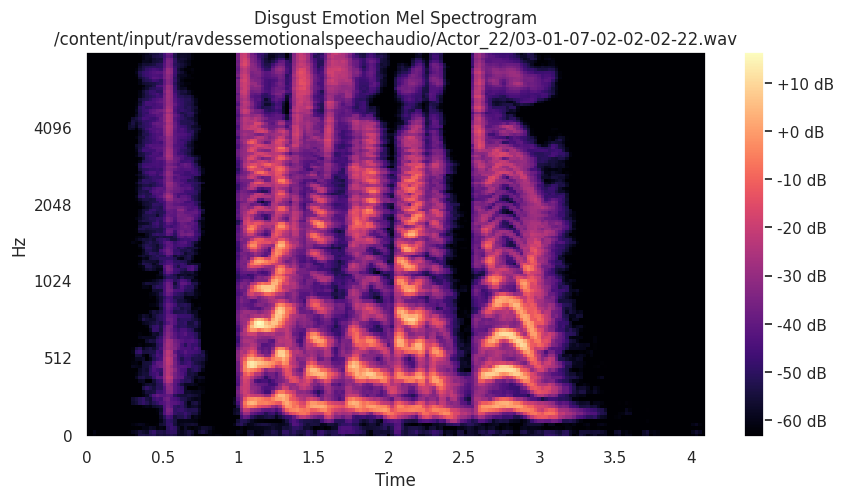

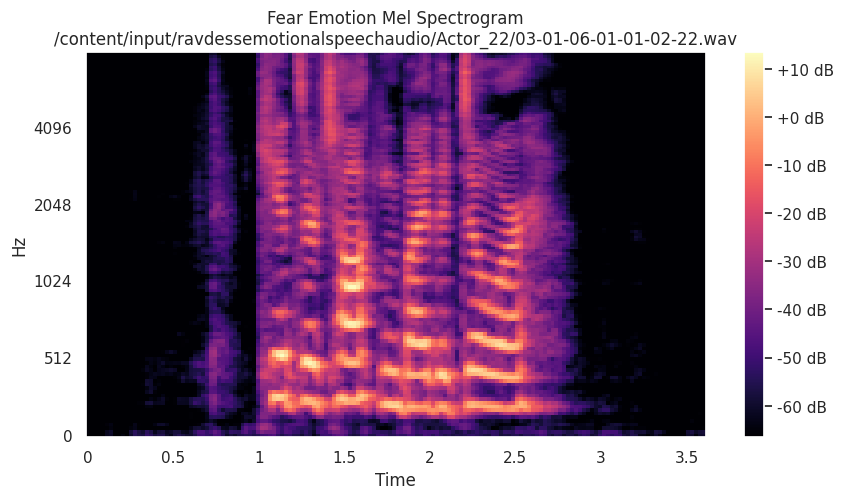

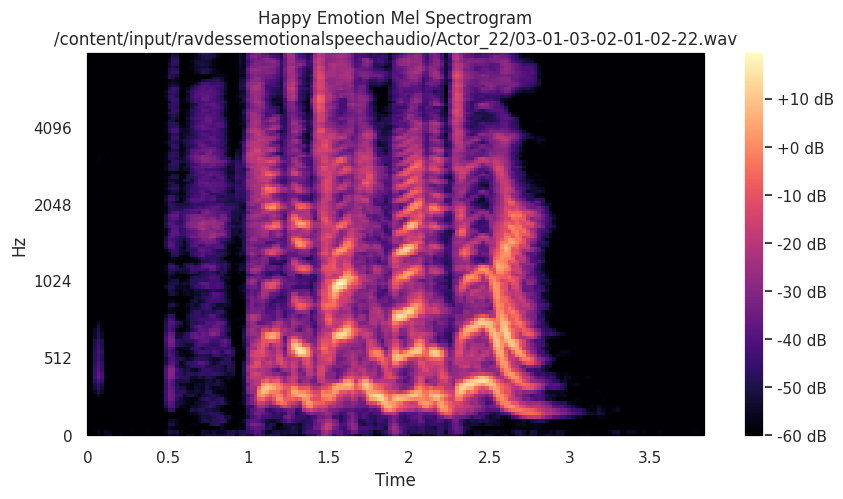

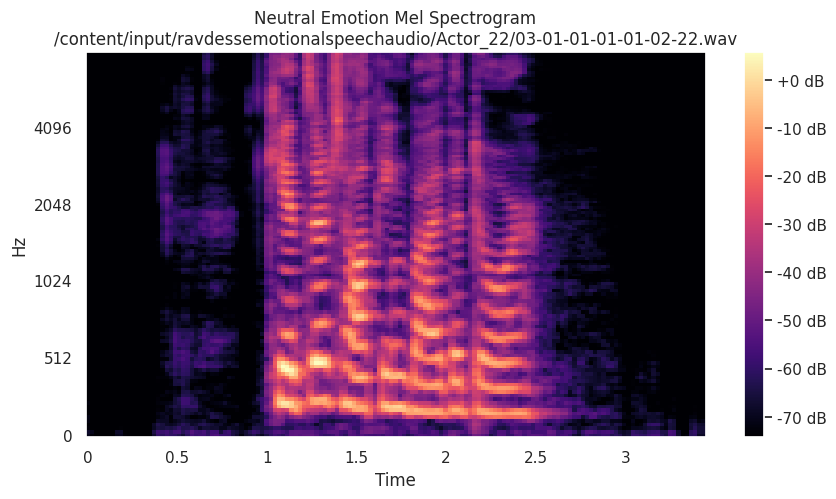

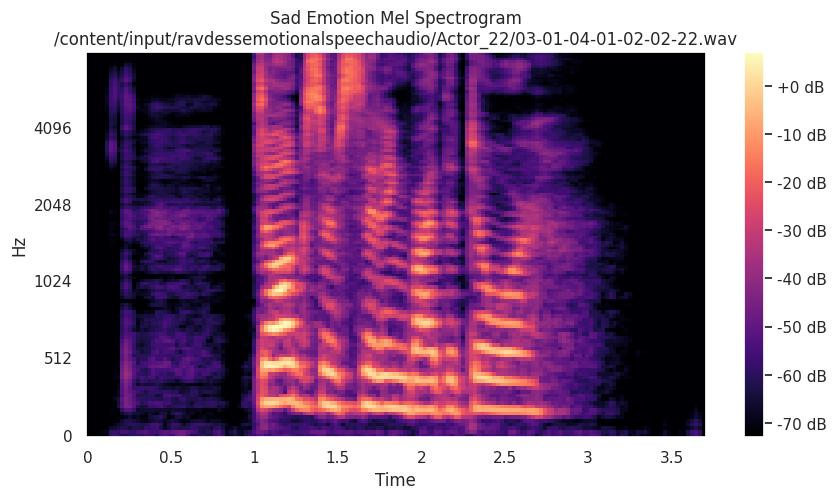

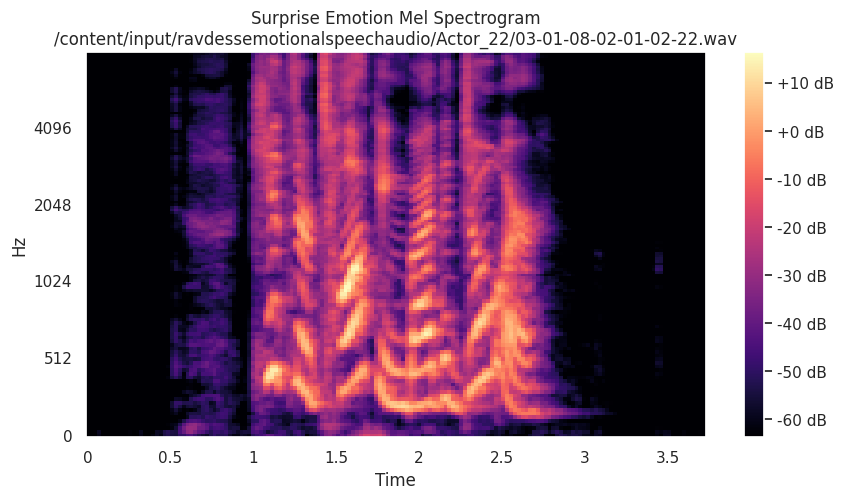

In [ ]:
def mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    spectrogram = librosa.feature.melspectrogram(y = audio_time_series, sr = sampling_rate, n_mels = 128,fmax = 8000)
    spectrogram = librosa.power_to_db(spectrogram)
    plt.figure(figsize = (10, 5))
    plt.title(f'{emotion_class.capitalize()} Emotion Mel Spectrogram\n{file_path}')
    librosa.display.specshow(spectrogram, fmax = 8000, x_axis = 'time',y_axis = 'mel')
    plt.colorbar(format = '%+2.0f dB')


audio_path = []
for emotion_class in emotions_classes:
    file_path = np.array(combined_df['location'][combined_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path)
    audio_path.append(file_path)

1.19 Play the Sound File For Each of the Emotions Above to Make Sure Sound Files are Valid and Match the Waveform, Spectogram, and Mel Spectrogram Above.

###**Play Sample Audio Clips for Each Emotion Class**
This section plays one audio sample per emotion class from the dataset, allowing you to listen and compare how different emotions sound. It provides useful auditory insight into emotional expression in speech.



In [ ]:
print('emotions_classes =', emotions_classes,'\n')

for i in range(len(emotions_classes) - 1):
        print(emotions_classes[i].capitalize(), 'Audio Sample\n')
        print(audio_path[i])
        IPython.display.display(IPython.display.Audio(data = audio_path[i]))

emotions_classes = ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'] 

Angry Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-05-01-01-01-22.wav


Calm Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-02-01-01-01-22.wav


Disgust Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-07-02-02-02-22.wav


Fear Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-06-01-01-02-22.wav


Happy Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-03-02-01-02-22.wav


Neutral Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-01-01-01-02-22.wav


Sad Audio Sample

/content/input/ravdessemotionalspeechaudio/Actor_22/03-01-04-01-02-02-22.wav


#2. Select and Engineer Features
2.1 Audio Data Augmentation

Noise Injection
Pitching
Stretching

### **Noise Injection for Data Augmentation**
This section demonstrates noise injection on an audio sample labeled with the "fear" emotion. It shows both the original and augmented waveforms and plays the corresponding audio clips to compare how noise affects the signal.



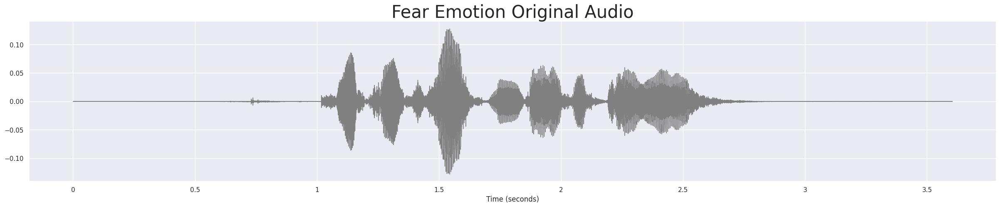

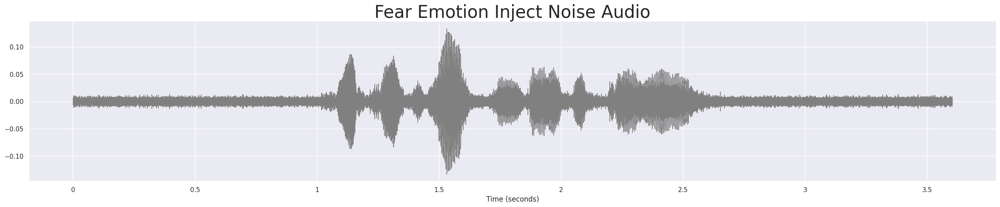

In [ ]:
# Noise Injection.
def inject_noise(data, sampling_rate = 0.035, threshold = 0.075, random = False):
    if random:
        sampling_rate = np.random.random() * threshold
    noise_amplitude = sampling_rate * np.random.uniform() * np.amax(data)
    augmented_data = data + noise_amplitude * np.random.normal(size = data.shape[0])
    return augmented_data


# Test audio file (fear emotion).
data, sampling_rate = librosa.load(path = audio_path[3])

IPython.display.display(IPython.display.Audio(data = audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(y = data, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

noise_audio = inject_noise(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = noise_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Inject Noise Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = noise_audio, rate = sampling_rate))

### **Pitch Shifting for Data Augmentation**
This section applies pitch shifting to a "fear" emotion audio sample, modifying its frequency while preserving duration. The effect is visualized as a waveform and the altered audio is played for comparison with the original.

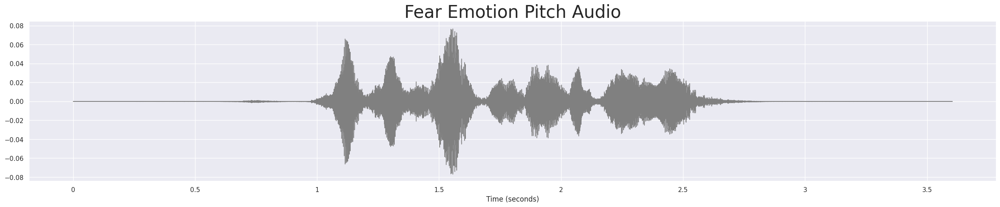

In [ ]:
# Pitching.
def pitching(data, sampling_rate, pitch_factor = 0.7,random = False):
    if random:
        pitch_factor= np.random.random() * pitch_factor
    return librosa.effects.pitch_shift(y = data, sr = sampling_rate, n_steps = pitch_factor)


# Test audio file (fear emotion).
pitch_audio = pitching(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = pitch_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Pitch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = pitch_audio, rate = sampling_rate))

### **Time Stretching for Data Augmentation**
This section demonstrates time stretching on a "fear" emotion audio sample by slightly slowing down the playback speed. The resulting waveform and audio are presented to observe how temporal changes affect speech characteristics.



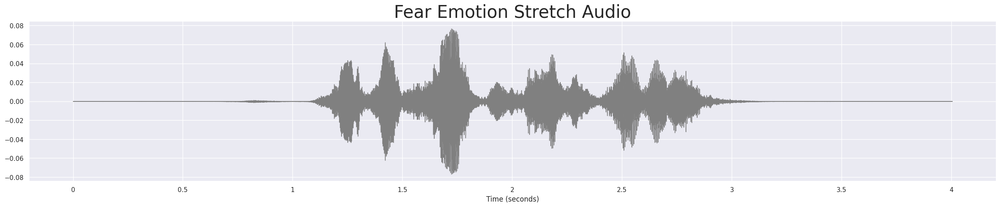

In [ ]:
# Stretching.
def stretching(data,r = 0.9):
    return librosa.effects.time_stretch(y = data, rate = r)


# Test audio file (fear emotion).
stretch_audio = stretching(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = stretch_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Stretch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = stretch_audio, rate = sampling_rate))

### **Combined Audio Augmentation Pipeline**
This section defines a pipeline that sequentially applies pitch shifting, noise injection, and time stretching to an audio sample. It visualizes and plays both the original and augmented "fear" emotion audio to demonstrate the full effect of combined augmentation techniques.

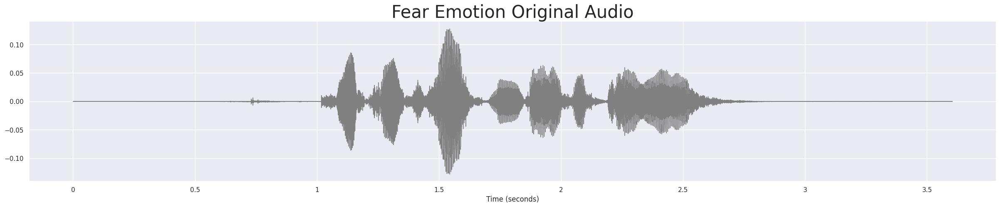

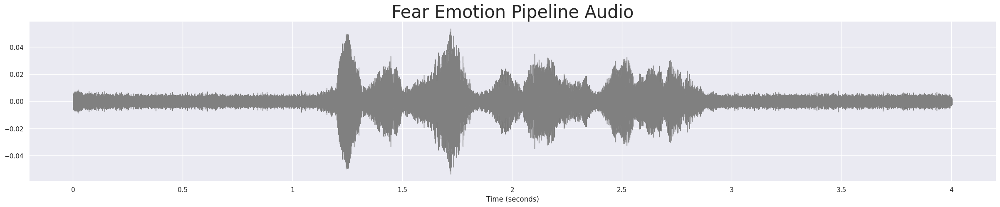

In [ ]:
# Pipeline function that applies all the audio data augmentation functions we just built.
def pipeline(data, sampling_rate):
    data = pitching(data, sampling_rate, random = True)
    data = inject_noise(data, random = True)
    data = stretching(data)
    return data


# Test audio file (fear emotion).
data, sampling_rate = librosa.load(path = audio_path[3])

IPython.display.display(IPython.display.Audio(data = audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(y = data, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

pipeline_audio = pipeline(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(y = pipeline_audio, sr = sampling_rate, color = '#808080', x_axis = 's')
plt.title('Fear Emotion Pipeline Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(data = pipeline_audio, rate = sampling_rate))

## 2.2 **Audio Data Feature Extraction**

Zero Crossing Rate: The rate of sign-changes of the signal during the duration of a particular frame.

Root Mean Square: Metering tool that measures the average loudness of an audio track within a window of roughly 300 milliseconds.

Mel Frequency Cepstral Coefficients: Form a cepstral representation where the frequency bands are not linear but distributed according to the mel-scale.

Chromagram: Represents the 12 different pitches under an audio file, in one place so that we can understand the classification of the pitches in the audio files.

Melspectrogram: Scale of pitches that can be felt by the listener to be equal in distance from one another.

Spectral Centroid: The center of gravity of the spectrum.

Spectral Bandwidth: The difference between the upper and lower frequencies in a continuous band of frequencies.

Spectral Rolloff: The frequency below which 90% of the magnitude distribution of the spectrum is concentrated.

Spectral Entropy: Entropy of the normalized spectral energies for a set of sub-frames.

Spectral Flux: The squared difference between the normalized magnitudes of the spectra of the two successive frames.

#### **NOTE: Due to memory limitation, we will only do Mel Frequency Cepstral Coefficients, Root Mean Square, and Zero Crossing Rate.**

In [ ]:
def zero_crossing_rate(data, frame_length, hop_length):
    zcr = librosa.feature.zero_crossing_rate(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(zcr)

def root_mean_square(data, frame_length = 2048, hop_length = 512):
    rms = librosa.feature.rms(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(rms)


def mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten:bool = True):
    mfcc = librosa.feature.mfcc(y = data,sr = sampling_rate)
    return np.squeeze(mfcc.T) if not flatten else np.ravel(mfcc.T)


def chroma_stft(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten: bool = True):
    short_time_fourier_transform = np.abs(librosa.stft(data))
    chroma = librosa.feature.chroma_stft(sr = sampling_rate, S = short_time_fourier_transform)
    return np.squeeze(chroma.T) if not flatten else np.ravel(chroma.T)

def melspectrogram(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten: bool = True):
    melspect = librosa.feature.melspectrogram(y = data, sr = sampling_rate)
    return np.squeeze(melspect.T) if not flatten else np.ravel(melspect.T)


def spectral_centroid(data, sampling_rate, frame_length = 2048, hop_length = 512):
    scentroid = librosa.feature.spectral_centroid(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(scentroid)


def spectral_bandwidth(data, sampling_rate, frame_length = 2048, hop_length = 512):
    sbandwidth = librosa.feature.spectral_bandwidth(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(sbandwidth)


def spectral_rolloff(data, sampling_rate, frame_length = 2048, hop_length = 512):
    srolloff = librosa.feature.spectral_rolloff(y = data, sr = sampling_rate, n_fft = frame_length, hop_length = hop_length)
    return np.squeeze(srolloff)


def spectral_entropyy(data, sampling_rate):
    sentropy = spectral_entropy(x = data, sf = sampling_rate)
    return np.squeeze(sentropy)


def spectral_flux(data, sampling_rate):
    sflux = librosa.onset.onset_strength(y = data, sr = sampling_rate)
    return np.squeeze(sflux)

### **Extract Key Audio Features**
This function extracts core audio features from a signal—zero-crossing rate, root mean square energy, and MFCCs. These features help characterize emotional tone and are essential inputs for training machine learning models.

In [ ]:
def feature_extraction(data, sampling_rate, frame_length = 2048, hop_length = 512):
    result = np.array([])
    result = np.hstack((result,
                        zero_crossing_rate(data, frame_length, hop_length),
                        root_mean_square(data, frame_length, hop_length),
                        mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length, hop_length),
#                         chroma_stft(data, sampling_rate, frame_length, hop_length),
#                         melspectrogram(data, sampling_rate, frame_length, hop_length),
#                         spectral_centroid(data, sampling_rate, frame_length, hop_length),
#                         spectral_bandwidth(data, sampling_rate, frame_length, hop_length),
#                         spectral_rolloff(data, sampling_rate, frame_length, hop_length),
#                         spectral_entropyy(data, sampling_rate),
#                         spectral_flux(data, sampling_rate)
                     ))
    return result

#### **Four Times More Rows Than The Original/Initial Dataset Because For Each Audio File We Now Have Four Rows Representing:**

No Audio Data Augmentation (first row)
Inject Noise (second row)
Pitching (third row)
Stretching (fourth row)
Pitching and Inject Noise (fifth row)
Stretching and Pitching (sixth row)
Pitching, Inject Noise, and Stretching (seventh row)

#### **NOTE: Due to memory limitation, we will only do No Audio Data Augmentation, Inject Noise, Pitching, and Pitching and Inject Noise.**

In [ ]:
# Duration and offset act as placeholders because there is no audio in start and the ending of each audio file is noramlly below three seconds.
def get_features(file_path, duration = 2.5, offset = 0.6):
    data, sampling_rate = librosa.load(path = file_path, duration = duration, offset = offset)

    # No audio data augmentation.
    audio_1 = feature_extraction(data, sampling_rate)
#     audio_1.resize((1, 19921))
    audio = np.array(audio_1)

    # Inject Noise.
    noise_audio_1 = inject_noise(data, random = True)
    audio_2 =  feature_extraction(noise_audio_1, sampling_rate)
#     audio_2.resize((1, 19921))
    audio = np.vstack((audio, audio_2))

    # Pitching.
    pitch_audio_1 = pitching(data, sampling_rate, random = True)
    audio_3 = feature_extraction(pitch_audio_1, sampling_rate)
#     audio_3.resize((1, 19921))
    audio = np.vstack((audio, audio_3))

#     # Stretching.
#     stretch_audio_1 = stretching(data)
#     audio_4 = feature_extraction(stretch_audio_1, sampling_rate)
#     audio_4.resize((1, 19921))
#     audio = np.vstack((audio, audio_4))

    # Pitching and Inject Noise.
    pitch_audio_2 = pitching(data, sampling_rate, random = True)
    pitch_noise_audio_1 = inject_noise(pitch_audio_2, random = True)
    audio_5 = feature_extraction(pitch_noise_audio_1, sampling_rate)
#     audio_5.resize((1, 19921))
    audio = np.vstack((audio, audio_5))


#     # Stretching and Pitching.
#     stretch_audio_2 = stretching(data)
#     stretch_pitch_audio_1 = pitching(stretch_audio_2, sampling_rate, random = True)
#     audio_6 = feature_extraction(stretch_pitch_audio_1, sampling_rate)
#     audio_6.resize((1, 19921))
#     audio = np.vstack((audio, audio_6))

#     # Pitching, Inject Noise, and Stretching.
#     pitch_noise_stretch_audio_1 = pipeline(data, sampling_rate)
#     audio_7 =  feature_extraction(pitch_noise_stretch_audio_1, sampling_rate)
#     audio_7.resize((1, 19921))
#     audio = np.vstack((audio, audio_7))

    audio_features = audio

    return audio_features


2.3 Extract Audio Data Features From Each Audio File

### **Extract Audio Features from All Audio Files**
This loop iterates over every audio file in the combined dataset and applies feature extraction, including augmentations. It stores features along with corresponding gender, emotion, and file path. A progress bar tracks the extraction process.



In [ ]:
audio_features_list = []
genders_list = []
emotions_list = []
locations_list = []

print('Audio Data - Features Extraction Starts')

for gender, emotion, file_path, index in zip(combined_df.gender, combined_df.emotion, combined_df.location, tqdm(range(combined_df.location.shape[0]))):
    audio_features = get_features(file_path)

    if index % 1 == 0:
        print(index, ' audio files have been feature extracted(', round(index / 12162 * 100), '%)\r', sep = '', end = '')

    for i in audio_features:
        audio_features_list.append(i)
        genders_list.append(gender)
        emotions_list.append(emotion)
        locations_list.append(file_path)

print('\nAudio Data - Features Extraction Ends')

Audio Data - Features Extraction Starts


  0%|          | 0/12162 [00:00<?, ?it/s]

12161 audio files have been feature extracted(100%)
Audio Data - Features Extraction Ends


2.4 Convert the Audio Data Features From Each Audio File to a Dataframe

### **Create DataFrame from Extracted Audio Features**
This step converts the extracted audio features into a structured DataFrame and appends corresponding gender, emotion, and file path columns. This organized format is ideal for further preprocessing and model training.

In [ ]:
audio_features_tuple = tuple(audio_features_list)

audio_features_df = pd.DataFrame(audio_features_tuple)

audio_features_df['gender'] = genders_list
audio_features_df['emotion'] = emotions_list
audio_features_df['location'] = locations_list

### **View the Shape and Contents of the Final Feature DataFrame**
This step displays the dimensions and a preview of the complete audio_features_df, confirming that all features and metadata (gender, emotion, location) have been successfully combined.

In [ ]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')

audio_features_df

audio_features_df.shape = (48648, 2379) 



,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
0,0.226074,0.325195,0.404785,0.340820,0.312988,0.287598,0.311523,0.346191,0.363770,0.404785,...,0.978152,0.961563,0.944039,0.925641,0.906425,0.886451,0.865775,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
1,0.218262,0.308594,0.378418,0.313477,0.282715,0.259766,0.280273,0.305664,0.314941,0.334961,...,0.789954,0.889940,0.519389,0.050529,0.277204,1.005210,1.135826,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
2,0.214844,0.279785,0.340820,0.273926,0.257324,0.277344,0.322266,0.350586,0.327637,0.293945,...,0.616584,0.608674,0.600228,0.591258,0.581777,0.571796,0.561327,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
3,0.205566,0.275391,0.336426,0.278320,0.265625,0.284180,0.327148,0.346680,0.322754,0.290527,...,1.174193,1.082336,0.996506,0.917540,0.846066,0.782543,0.727305,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
4,0.078613,0.132812,0.187012,0.214355,0.229004,0.239746,0.247559,0.254883,0.247559,0.242188,...,0.510780,-0.266147,1.649313,2.750401,0.520501,-3.355539,-5.092211,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48643,0.044922,0.087891,0.117188,0.119141,0.108398,0.086914,0.086426,0.091797,0.109863,0.125977,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,fear,/content/input/torontoemotionalspeechsettess/T...
48644,0.041992,0.055176,0.061035,0.053711,0.035156,0.034668,0.039062,0.044922,0.053223,0.055176,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,fear,/content/input/torontoemotionalspeechsettess/T...
48645,0.043945,0.060059,0.078613,0.092773,0.086914,0.090332,0.084961,0.068359,0.061523,0.058105,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,fear,/content/input/torontoemotionalspeechsettess/T...
48646,0.039551,0.050781,0.059570,0.053223,0.045898,0.047852,0.051270,0.057129,0.064453,0.082520,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,female,fear,/content/input/torontoemotionalspeechsettess/T...


### 2.5 **Convert the Audio Data Features From Each Audio File to a .parquet File For Future Reference so that we Can Load it Without Doing the Feature Extraction Again**

In [ ]:
!pip install fastparquet

audio_features_df_parquet = audio_features_df
audio_features_df_parquet.columns = audio_features_df_parquet.columns.astype(str)

from google.colab import drive
drive.mount('/content/drive')
import os

drive_save_dir = '/content/drive/MyDrive/ColabModels'
os.makedirs(drive_save_dir, exist_ok=True)

audio_features_df_parquet.to_parquet(os.path.join(drive_save_dir, 'audio_features.parquet'), engine='fastparquet')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.6 MB/s eta 0:00:00
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Load Audio Features from Parquet File**
This cell installs the required fastparquet engine and loads a previously saved audio_features.parquet file from Google Drive into a DataFrame. It allows you to skip feature extraction when re-running the notebook.

In [ ]:
# # This is used to load the .parquet file into the audio_features_df whenever necessary.
!pip install fastparquet
# # File path to .parquet.
file_path_parquet = '/content/drive/MyDrive/ColabModels/audio_features.parquet'
audio_features_df = pd.read_parquet(file_path_parquet, engine='fastparquet')

2.6 Inspect / Replace NULL Values

### **Check and Handle Missing Values in Feature Data**
This section checks for any NaN or missing values in the feature DataFrame and replaces them with 0. This ensures the dataset is clean and ready for model training without errors caused by incomplete data.

In [ ]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')
print(audio_features_df.isnull().sum(), '\n')
print('audio_features_df.isnull().sum().sum() = ', audio_features_df.isnull().sum().sum())

print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)

print('Replacing NaN values with 0.\n')
audio_features_df = audio_features_df.fillna(0)

print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)

audio_features_df.shape = (48648, 2379) 

0               0
1               0
2               0
3               0
4               0
            ...  
2374        37624
2375        37624
gender          0
emotion         0
location        0
Length: 2379, dtype: int64 

audio_features_df.isnull().sum().sum() =  28245624
audio_features_df.shape = (48648, 2379) 

audio_features_df.isna().sum().sum() = 28245624 

0           False
1           False
2           False
3           False
4           False
            ...  
2374         True
2375         True
gender      False
emotion     False
location    False
Length: 2379, dtype: bool

Replacing NaN values with 0.

audio_features_df.shape = (48648, 2379) 

audio_features_df.isna().sum().sum() = 0 

0           False
1           False
2           False
3           False
4           False
            ...  
2374        False
2375        False
gender      False
emotion     False
location    False
Length: 2379, dtype: bool



,0
0,0
1,0
2,0
3,0
4,0
...,...
2374,0
2375,0
gender,0
emotion,0


2.7 Inspect/ Remove Duplicate Rows


### **Detect Duplicate Feature Rows**
This section identifies and displays duplicate rows in the audio features DataFrame. Detecting duplicates is important to prevent redundant data from affecting model training and evaluation.

In [ ]:
print('audio_features_df.duplicated().sum() = ', audio_features_df.duplicated().sum())

print('audio_features_df.shape =', audio_features_df.shape)

duplicates = audio_features_df[audio_features_df.duplicated()]

print('Duplicate Rows:')

duplicates

audio_features_df.duplicated().sum() =  2
audio_features_df.shape = (48648, 2379)
Duplicate Rows:


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
6202,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,female,sad,/content/input/cremad/AudioWAV/1076_MTI_SAD_XX...
6203,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,female,sad,/content/input/cremad/AudioWAV/1076_MTI_SAD_XX...


### **Remove Duplicate Rows from Feature Data**
This step removes any duplicate rows from the feature DataFrame to ensure data integrity. It also verifies the final shape of the dataset and confirms that no duplicates remain.



In [ ]:
print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df = audio_features_df.drop_duplicates()

print('audio_features_df.duplicated().sum() =', audio_features_df.duplicated().sum())

print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df

audio_features_df.shape = (48648, 2379)
audio_features_df.duplicated().sum() = 0
audio_features_df.shape = (48646, 2379)


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
0,0.226074,0.325195,0.404785,0.340820,0.312988,0.287598,0.311523,0.346191,0.363770,0.404785,...,0.978152,0.961563,0.944039,0.925641,0.906425,0.886451,0.865775,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
1,0.218262,0.308594,0.378418,0.313477,0.282715,0.259766,0.280273,0.305664,0.314941,0.334961,...,0.789954,0.889940,0.519389,0.050529,0.277204,1.005210,1.135826,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
2,0.214844,0.279785,0.340820,0.273926,0.257324,0.277344,0.322266,0.350586,0.327637,0.293945,...,0.616584,0.608674,0.600228,0.591258,0.581777,0.571796,0.561327,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
3,0.205566,0.275391,0.336426,0.278320,0.265625,0.284180,0.327148,0.346680,0.322754,0.290527,...,1.174193,1.082336,0.996506,0.917540,0.846066,0.782543,0.727305,female,calm,/content/input/ravdessemotionalspeechaudio/Act...
4,0.078613,0.132812,0.187012,0.214355,0.229004,0.239746,0.247559,0.254883,0.247559,0.242188,...,0.510780,-0.266147,1.649313,2.750401,0.520501,-3.355539,-5.092211,female,surprise,/content/input/ravdessemotionalspeechaudio/Act...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48643,0.044922,0.087891,0.117188,0.119141,0.108398,0.086914,0.086426,0.091797,0.109863,0.125977,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,fear,/content/input/torontoemotionalspeechsettess/T...
48644,0.041992,0.055176,0.061035,0.053711,0.035156,0.034668,0.039062,0.044922,0.053223,0.055176,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,fear,/content/input/torontoemotionalspeechsettess/T...
48645,0.043945,0.060059,0.078613,0.092773,0.086914,0.090332,0.084961,0.068359,0.061523,0.058105,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,fear,/content/input/torontoemotionalspeechsettess/T...
48646,0.039551,0.050781,0.059570,0.053223,0.045898,0.047852,0.051270,0.057129,0.064453,0.082520,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,fear,/content/input/torontoemotionalspeechsettess/T...


2.8 Print Out the Number Examples in Each Class (aka the class balances)

### **Check Emotion Distribution After Cleaning**
This line displays the count and proportion of each emotion class in the cleaned dataset. It helps verify that class distribution remains balanced and consistent after removing duplicates.

In [ ]:
audio_features_df.emotion.value_counts(), audio_features_df.emotion.value_counts(normalize = True)

(emotion
 disgust     7692
 fear        7692
 angry       7692
 happy       7692
 sad         7690
 neutral     6812
 surprise    2608
 calm         768
 Name: count, dtype: int64,
 emotion
 disgust     0.158122
 fear        0.158122
 angry       0.158122
 happy       0.158122
 sad         0.158081
 neutral     0.140032
 surprise    0.053612
 calm        0.015788
 Name: proportion, dtype: float64)

2.9 Print Out the Number of Unique Emotions

### **Extract Sorted List of Unique Emotions**
This step retrieves and prints a sorted list of all unique emotion labels from the cleaned dataset. It's useful for consistent label encoding and interpreting model predictions.



In [ ]:
emotions_classes = sorted(audio_features_df['emotion'].unique())
print(emotions_classes)

['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


2.10 Split Our Data Into Three Sets:

Training (80%)
Validating (10%)
Testing (10%)

### **Split Features and Labels**
This step separates the dataset into input features X and target labels y by removing non-numerical columns (emotion, gender, location) from the feature set.

In [ ]:
X = audio_features_df.drop(labels = ['emotion', 'gender', 'location'], axis = 1)
y = audio_features_df['emotion']

### **View Feature Matrix X**
This cell displays the extracted audio features (X) that will be used as input for model training. Each row represents an audio sample, and each column corresponds to a specific feature.

In [ ]:
X

,0,1,2,3,4,5,6,7,8,9,...,2366,2367,2368,2369,2370,2371,2372,2373,2374,2375
0,0.361816,0.555664,0.713379,0.744629,0.763184,0.800781,0.848145,0.852539,0.745117,0.514160,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.244629,0.369141,0.494141,0.490234,0.502441,0.504395,0.505859,0.506348,0.513672,0.511230,...,-2.712126,-1.401448,0.296121,0.798738,-2.718082,0.788936,1.173583,-2.483049,-2.649178,-1.771805
2,0.125977,0.190918,0.268555,0.260742,0.281738,0.293945,0.291016,0.324219,0.354004,0.378906,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.248535,0.372070,0.499512,0.510742,0.502441,0.505859,0.511230,0.503906,0.502930,0.501465,...,-2.764431,-4.613985,0.821432,0.148622,-5.415340,-5.159787,-3.295933,-3.070099,-2.251717,-4.768063
4,0.381836,0.588867,0.812500,0.851562,0.882324,0.909180,0.910645,0.879395,0.666016,0.668945,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48643,0.025879,0.056641,0.079590,0.081055,0.078125,0.060059,0.048340,0.052734,0.054688,0.065918,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48644,0.016602,0.025391,0.035156,0.030762,0.027344,0.025391,0.024414,0.025391,0.026855,0.026855,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48645,0.032227,0.059570,0.102051,0.125488,0.157227,0.189941,0.226074,0.285156,0.338379,0.346191,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48646,0.017578,0.027832,0.042969,0.037598,0.033203,0.026855,0.017578,0.022949,0.024902,0.030762,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### **View Target Labels y**
This cell displays the target emotion labels associated with each audio sample. These will be used as the ground truth for training and evaluating the model.

In [ ]:
y

,emotion
0,surprise
1,surprise
2,surprise
3,surprise
4,neutral
...,...
48643,surprise
48644,surprise
48645,surprise
48646,surprise


### **Save Feature and Label DataFrames to Google Drive**
This section mounts Google Drive and saves the preprocessed feature matrix X and label DataFrame y as .parquet files in the specified folder. These files can be reused later for model training or inference without reprocessing the raw data.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os

# Define the folder path in your Google Drive.
drive_save_dir = '/content/drive/MyDrive/ColabModels'
os.makedirs(drive_save_dir, exist_ok=True)

# Save X and y to the specified folder.
X.to_parquet(os.path.join(drive_save_dir, 'X.parquet'), engine='fastparquet')

y = y.to_frame(name='Emotion')
y.to_parquet(os.path.join(drive_save_dir, 'y.parquet'), engine='fastparquet')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# # This is used to load the .parquet files whenever necessary.
!pip install fastparquet
## # Read the .parquet files.
X = pd.read_parquet('X.parquet')
y = pd.read_parquet('y.parquet')

FileNotFoundError: [Errno 2] No such file or directory: 'X.parquet'

### **Encode Emotion Labels for Model Training**
This section encodes the emotion labels using LabelEncoder and converts them into one-hot encoded format using to_categorical, preparing them for training a classification model.



In [ ]:
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
y = to_categorical(label.fit_transform(y))

print(label.classes_)
y

['angry' 'calm' 'disgust' 'fear' 'happy' 'neutral' 'sad' 'surprise']


array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

### **Split Dataset into Train, Validation, and Test Sets**
This step splits the features and labels into training (80%), validation (10%), and test (10%) sets using train_test_split. This ensures fair model evaluation and tuning without data leakage.



In [ ]:
X_train, X_remain, y_train, y_remain = train_test_split(
    X, y, test_size = 0.2, random_state = 42)

print('X_remain.shape = ', X_remain.shape)
print('y_remain.shape = ', y_remain.shape)

X_valid, X_test, y_valid, y_test = train_test_split(
    X_remain, y_remain, test_size = 0.5, random_state = 42)

print('X_train.shape  = ', X_train.shape)
print('y_train.shape  = ', y_train.shape)
print('X_valid.shape  = ', X_valid.shape)
print('y_valid.shape  = ', y_valid.shape)
print('X_test.shape   = ', X_test.shape)
print('y_test.shape   = ', y_test.shape)

X_remain.shape =  (9730, 2376)
y_remain.shape =  (9730, 8)
X_train.shape  =  (38916, 2376)
y_train.shape  =  (38916, 8)
X_valid.shape  =  (4865, 2376)
y_valid.shape  =  (4865, 8)
X_test.shape   =  (4865, 2376)
y_test.shape   =  (4865, 8)


### **Scale Features and Save Scaler to Google Drive**
This section fits a StandardScaler on the training data and applies it to the validation and test sets. The fitted scaler is then saved to Google Drive for consistent preprocessing during future inference.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
import pickle

# Define the save directory in your Google Drive.
drive_save_dir = "/content/drive/MyDrive/ColabModels"
os.makedirs(drive_save_dir, exist_ok=True)

# 1. Fit the scaler
standard_scaler = StandardScaler()
X_train = standard_scaler.fit_transform(X_train.values)

# 2. Transform validation/test
X_valid = standard_scaler.transform(X_valid.values)
X_test  = standard_scaler.transform(X_test.values)

print('X_train.shape  = ', X_train.shape)
print('X_valid.shape  = ', X_valid.shape)
print('X_test.shape   = ', X_test.shape)

# 3. Save the fitted scaler for future inference in your Drive
scaler_path = os.path.join(drive_save_dir, "scaler.pkl")
with open(scaler_path, "wb") as f:
    pickle.dump(standard_scaler, f)
print("Scaler saved as", scaler_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
X_train.shape  =  (38916, 2376)
X_valid.shape  =  (4865, 2376)
X_test.shape   =  (4865, 2376)
Scaler saved as /content/drive/MyDrive/ColabModels/scaler.pkl


### **Reshape Feature Data for 1D CNN Input**
This step expands the feature dimensions to make them compatible with a 1D Convolutional Neural Network (1D-CNN). The reshaping adds an extra axis to represent channels, which is required by convolutional layers.



In [ ]:
# Modify data to fit into a 1D-CNN.

X_train = np.expand_dims(X_train, axis = 2)
X_valid = np.expand_dims(X_valid, axis = 2)
X_test = np.expand_dims(X_test, axis = 2)

print('X_train.shape  = ', X_train.shape)
print('X_remain.shape = ', X_remain.shape)
print('X_valid.shape  = ', X_valid.shape)
print('X_test.shape   = ', X_test.shape)

X_train.shape  =  (38916, 2376, 1)
X_remain.shape =  (9730, 2376)
X_valid.shape  =  (4865, 2376, 1)
X_test.shape   =  (4865, 2376, 1)


### **Confirm Final Shapes of Feature and Label Sets**
This step prints the final shapes of the training, validation, and test sets for both features (X) and labels (y). It's a useful sanity check before feeding the data into the model.

In [ ]:
print('X_train.shape', X_train.shape)
print('X_valid.shape', X_valid.shape)
print('X_test.shape', X_test.shape)

print('y_train.shape', y_train.shape)
print('y_valid.shape', y_valid.shape)
print('y_test.shape', y_test.shape)

X_train.shape (38916, 2376, 1)
X_valid.shape (4865, 2376, 1)
X_test.shape (4865, 2376, 1)
y_train.shape (38916, 8)
y_valid.shape (4865, 8)
y_test.shape (4865, 8)



#3 Build and Train Model
3.1 Build / Define the Model

### **Set Up Early Stopping Callback**
This callback monitors validation accuracy during training and stops early if performance doesn't improve for 10 consecutive epochs. It also restores the best model weights to avoid overfitting.



In [ ]:
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                               patience = 10,
                               mode = 'auto',
                               restore_best_weights = True)

### **Set Up Learning Rate Reduction on Plateau**
This callback reduces the learning rate by a factor of 0.5 if validation accuracy stops improving, helping the model converge more effectively. It prevents getting stuck at suboptimal performance.



In [ ]:
reduce_learning_rate = ReduceLROnPlateau(monitor ='val_accuracy',
                                         factor = 0.5,
                                         verbose = 1,
                                         min_lr = 0.00001)

### **Build 1D-CNN Model for Emotion Classification**
This section defines a deep 1D Convolutional Neural Network architecture using multiple convolution, batch normalization, and pooling layers. The final output layer uses softmax activation for multiclass emotion prediction. The model is compiled with the Adam optimizer and categorical crossentropy loss.

In [ ]:
# Create the neural network.

model = models.Sequential()

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu', input_shape = (X_train.shape[1], 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 128, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 3, strides = 2, padding = 'same'))

model.add(layers.Flatten())

model.add(layers.Dense(units = 512, activation = 'relu'))

model.add(layers.BatchNormalization())

model.add(layers.Dense(units = 8, activation = 'softmax'))

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 2376, 512)           │           3,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2376, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 1188, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 1188, 512)           │       1,311,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 1188, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 594, 512)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 594, 512)            │       1,311,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 594, 512)            │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 297, 512)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 297, 512)            │       1,311,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 297, 512)            │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 149, 512)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_4 (Conv1D)                    │ (None, 149, 256)            │         655,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 149, 256)            │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_4 (MaxPooling1D)       │ (None, 75, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_5 (Conv1D)                    │ (None, 75, 256)             │         196,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 75, 256)             │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_5 (MaxPooling1D)       │ (None, 38, 256)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 6,150,280 (23.46 MB)

 Trainable params: 6,143,880 (23.44 MB)

 Non-trainable params: 6,400 (25.00 KB)

None


3.3 Train the Model

### **Prepare Data and Train the 1D-CNN Model**
This section reshapes the feature data for CNN compatibility, encodes string emotion labels into one-hot vectors, and trains the model using the training and validation sets. Early stopping and learning rate reduction callbacks are applied to optimize performance.



In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

# Convert X_train and X_valid to numeric arrays and ensure they are float32.
X_train = np.asarray(X_train, dtype=np.float32)
X_valid = np.asarray(X_valid, dtype=np.float32)

# Reshape X_train and X_valid to add a channel dimension (for Conv1D).
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_valid = X_valid.reshape((X_valid.shape[0], X_valid.shape[1], 1))

# Convert labels from strings to numeric.
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_valid_encoded = label_encoder.transform(y_valid)

# One-hot encode the labels.
y_train = to_categorical(y_train_encoded)
y_valid = to_categorical(y_valid_encoded)

# Now fit your model.
history_callback_object = model.fit(
    x=X_train,
    y=y_train,
    batch_size=64,
    epochs=43,
    callbacks=[early_stopping, reduce_learning_rate],
    validation_data=(X_valid, y_valid)
)

Epoch 1/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 198s 291ms/step - accuracy: 0.3914 - loss: 1.6968 - val_accuracy: 0.5083 - val_loss: 1.3099 - learning_rate: 0.0010
Epoch 2/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 176s 289ms/step - accuracy: 0.5567 - loss: 1.1490 - val_accuracy: 0.5714 - val_loss: 1.1298 - learning_rate: 0.0010
Epoch 3/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 202s 288ms/step - accuracy: 0.5985 - loss: 1.0447 - val_accuracy: 0.5977 - val_loss: 1.0680 - learning_rate: 0.0010
Epoch 4/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 201s 287ms/step - accuracy: 0.6234 - loss: 0.9862 - val_accuracy: 0.5293 - val_loss: 1.2507 - learning_rate: 0.0010
Epoch 5/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 202s 286ms/step - accuracy: 0.6690 - loss: 0.8567 - val_accuracy: 0.6578 - val_loss: 0.9102 - learning_rate: 0.0010
Epoch 6/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 202s 287ms/step - accuracy: 0.7068 - loss: 0.7669 - val_accuracy: 0.6312 - val_loss: 0.9784 - learning_rate: 0.0010
Epoch 7/43
609/609 ━━━━━━━━━━━━━━━━━━━━ 201s 286ms/step - accura

4.2 Model Accuracy Graph

In [ ]:
fig = px.line(data_frame = history_callback_object.history,
              y = ['accuracy', 'val_accuracy'],
              labels = {'index':'Epoch', 'value':'Accuracy'},
              title = 'Accuracy vs Epoch')
fig.show()

history_callback_object.history.keys()

NameError: name 'history_callback_object' is not defined

4.3 Side to Side Model Loss and Accuracy Graphs

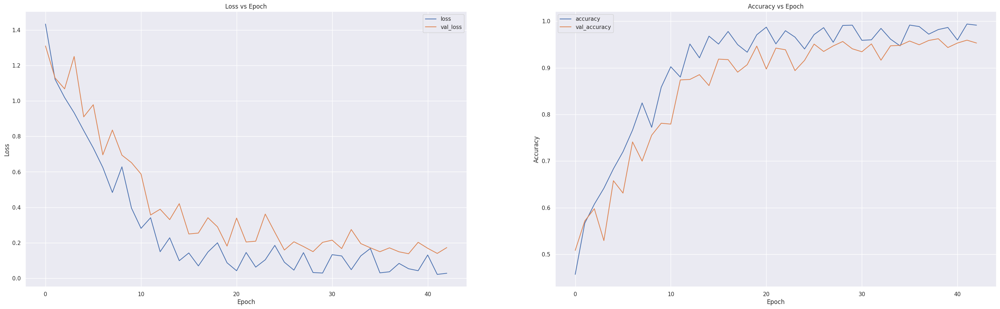

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.plot(history_callback_object.history['loss'], label = 'loss')
ax1.plot(history_callback_object.history['val_loss'], label = 'val_loss')
ax1.legend()
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Loss vs Epoch')
ax1.grid(True)

ax2.plot(history_callback_object.history['accuracy'], label = 'accuracy')
ax2.plot(history_callback_object.history['val_accuracy'], label = 'val_accuracy')
ax2.legend()
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy vs Epoch')
ax2.grid(True)

fig.set_figheight(10)
fig.set_figwidth(35)
plt.show()

history_callback_object.history.keys()

4.4 Make and Evaluate New Predictions Using Our Testing Data

In [ ]:
from tensorflow.keras.models import load_model

from google.colab import drive
drive.mount('/content/drive')

# Paths for model, scaler, and parquet files.
model_path = "/content/drive/MyDrive/ColabModels/my_model.h5"

model = load_model(model_path)
print("Model loaded successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Model loaded successfully!


In [ ]:
# y_pred stores the probabilities for each emotion. The highest probability corresponds to the predicted emotion.
y_pred = model.predict(X_test)
print(y_pred[0])
y_pred

153/153 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step
[4.0104719e-06 3.5437622e-13 9.9582952e-01 7.9409743e-05 4.0869070e-03
 1.0685691e-07 2.2582473e-10 4.7159845e-09]


array([[4.0104719e-06, 3.5437622e-13, 9.9582952e-01, ..., 1.0685691e-07,
        2.2582473e-10, 4.7159845e-09],
       [1.7962005e-08, 2.5332371e-12, 7.5472293e-08, ..., 2.0638014e-08,
        1.7260643e-09, 1.5914419e-09],
       [1.6004233e-10, 1.9099416e-12, 1.2685927e-12, ..., 4.5472946e-13,
        1.4467062e-10, 2.6464847e-06],
       ...,
       [9.9929714e-01, 6.5783885e-11, 3.0870458e-05, ..., 6.0917055e-10,
        3.1685074e-10, 7.8314820e-08],
       [1.8438027e-10, 2.5910149e-10, 2.9994122e-05, ..., 7.6767011e-09,
        6.1752660e-05, 4.9324225e-12],
       [9.3292573e-07, 1.8441051e-16, 9.9999893e-01, ..., 2.7593481e-15,
        7.8411305e-10, 1.7072256e-14]], dtype=float32)

In [ ]:
y_pred = np.argmax(y_pred, axis = 1)
print(y_pred[0])
y_pred

2


array([2, 3, 4, ..., 0, 3, 2])

In [ ]:
y_check = np.argmax(y_test, axis = 1)
print(y_check[0])
y_check

2


array([2, 3, 4, ..., 0, 3, 2])

In [ ]:
print('Accuracy of model on test data: ', model.evaluate(X_test, y_test)[1] * 100 , '%', sep = '')

153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.9835 - loss: 0.0596
Accuracy of model on test data: 98.25282692909241%


In [ ]:
model_loss, model_accuracy = model.evaluate(X_test, y_test)

print('Model Test Loss: %f' % (model_loss))
print('Model Test Loss: %f' % (model_loss * 100), '%\n', sep = '')
print('Model Test Accuracy: %f' % (model_accuracy))
print('Model Test Accuracy: %f' % (model_accuracy * 100), '%', sep = '')

153/153 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - accuracy: 0.9835 - loss: 0.0596
Model Test Loss: 0.073277
Model Test Loss: 7.327677%

Model Test Accuracy: 0.982528
Model Test Accuracy: 98.252827%


In [ ]:
# Calculate our accuracy score.
accuracy = accuracy_score(y_check, y_pred)

# Calculate our precision score.
precision = precision_score(y_check, y_pred, average = 'micro')

# Calculate our recall score.
recall = recall_score(y_check, y_pred, average = 'micro')

# Calculate our f1-score.
f1 = f1_score(y_check, y_pred, average = 'micro')

# Print each of our scores to inspect performance.
print('Accuracy Score: %f' % (accuracy * 100), '%', sep = '')
print('Precision Score: %f' % (precision * 100), '%', sep = '')
print('Recall Score: %f' % (recall * 100), '%', sep = '')
print('F1 Score: %f' % (f1 * 100), '%', sep = '')

Accuracy Score: 98.252826%
Precision Score: 98.252826%
Recall Score: 98.252826%
F1 Score: 98.252826%


4.5 Confusion Matrix

[[[4081   13]
  [  14  757]]

 [[4790    2]
  [   2   71]]

 [[4045   10]
  [  17  793]]

 [[4078   20]
  [  23  744]]

 [[4091   16]
  [  13  745]]

 [[4175   14]
  [   8  668]]

 [[4094   16]
  [  10  745]]

 [[4609    1]
  [   5  250]]] 



          angry  calm  disgust  fear  happy  neutral  sad  surprise
angry       757     0        4     8      1        1    0         0
calm          0    71        0     1      0        0    1         0
disgust       4     1      793     4      3        1    4         0
fear          3     0        4   744      6        3    7         0
happy         4     0        0     5    745        2    1         1
neutral       1     0        0     0      4      668    3         0
sad           0     1        1     1      0        7  745         0
surprise      1     0        1     1      2        0    0       250 





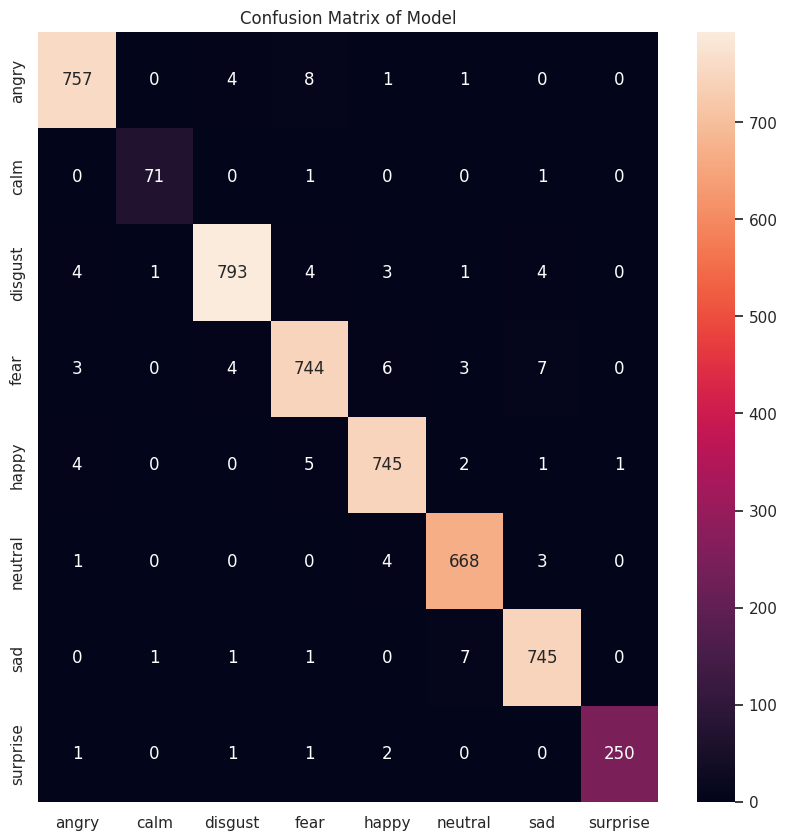

In [ ]:
fig = plt.figure(figsize=(10, 10))
plt.title('Confusion Matrix of Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')

cm = multilabel_confusion_matrix(y_check, y_pred)
print(cm, '\n\n\n')

model_matrix = confusion_matrix(y_check, y_pred)
cm = pd.DataFrame(model_matrix,
                  index = [i for i in emotions_classes],
                  columns = [i for i in emotions_classes]
                 )


ax = sns.heatmap(cm,
                 annot = True,
                 fmt = 'd',cbar=True)

print(cm, '\n\n\n')

plt.show()

4.6 Classification Report

In [ ]:
print('Model Classification Report\n', classification_report(y_check, y_pred, target_names = emotions_classes))

Model Classification Report
               precision    recall  f1-score   support

       angry       0.98      0.98      0.98       771
        calm       0.97      0.97      0.97        73
     disgust       0.99      0.98      0.98       810
        fear       0.97      0.97      0.97       767
       happy       0.98      0.98      0.98       758
     neutral       0.98      0.99      0.98       676
         sad       0.98      0.99      0.98       755
    surprise       1.00      0.98      0.99       255

    accuracy                           0.98      4865
   macro avg       0.98      0.98      0.98      4865
weighted avg       0.98      0.98      0.98      4865



## **Testing the Model on Unseen Audio Files (Uploading an audio file as well as Recording via microphone)**




Loading the model

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os
from tensorflow.keras.models import load_model

drive_path = "/content/drive/MyDrive/ColabModels"
model_path = os.path.join(drive_path, "my_model.h5")

# Load the trained model
model = load_model(model_path)

print("Model loaded successfully!")

Mounted at /content/drive


Model loaded successfully!


In [ ]:
# Increase ndarray dimensions to [4,2376].
def increase_ndarray_size(features_test):
    tmp = np.zeros([4, 2377])
    offsets = [0, 1]
    insert_here = tuple([slice(offsets[dim], offsets[dim] + features_test.shape[dim]) for dim in range(features_test.ndim)])
    tmp[insert_here] = features_test
    features_test = tmp
    features_test = np.delete(features_test, 0, axis=1)
    return features_test

In [ ]:
# Make the prediction.
def predict(features_test):
    features_test = standard_scaler.transform(features_test)
    features_test = np.expand_dims(features_test, axis = 2)
    print('features_test.shape = ', features_test.shape)

    y_pred = model.predict(features_test)
    print('Probabilities for each and every emotion for each and every feature extraction.\n\n',y_pred)
    y_pred = np.argmax(y_pred, axis = 1)
    print('\nPredicted emotion for each and every feature extraction.\n\n', y_pred)
    print('\nemotions_classes = ', emotions_classes)
    try:
        print('\nModel predicted emotion: ', emotions_classes[mode(y_pred)])
    except:
        print('\nModel predicted emotion: ',  emotions_classes[y_pred[0]])
    print('************************************************')

In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to your saved scaler file (.pkl)
scaler_path = "/content/drive/MyDrive/ColabModels/scaler.pkl"

# Load the scaler
with open(scaler_path, 'rb') as f:
    standard_scaler = pickle.load(f)

print("Scaler loaded successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Scaler loaded successfully!


### **Upload an unknown audio file which is roughly 2.5-3 seconds to predict emotion**

In [ ]:
from google.colab import files
import IPython.display
import librosa

# 1. Upload the file
uploaded = files.upload()

# 2. Extract the file name
sound_file_path = next(iter(uploaded.keys()))

# 3. Extract features
features_test = get_features(sound_file_path)
print('Number of extractions:', len(features_test))
print('Initial features_test.shape = ', features_test.shape)

# 4. Resize the array if necessary
if features_test.shape[1] < 2376:
    features_test = increase_ndarray_size(features_test)
    print('After resizing, features_test.shape = ', features_test.shape)

# 5. Predict once (on the final shape)
predict(features_test)

# 6. Display the audio and duration
IPython.display.display(IPython.display.Audio(data=sound_file_path))
print('Duration:', librosa.get_duration(filename=sound_file_path))

Saving Reem_Happy.ogg to Reem_Happy.ogg
Number of extractions: 4
Initial features_test.shape =  (4, 2376)
features_test.shape =  (4, 2376, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Probabilities for each and every emotion for each and every feature extraction.

 [[3.1425918e-03 1.0505959e-06 1.4116855e-05 1.5065729e-02 9.8162043e-01
  3.9687794e-07 1.5414774e-04 1.5526120e-06]
 [1.3232312e-01 1.1969289e-06 4.3741582e-07 8.1125051e-02 7.6276505e-01
  1.1305971e-07 4.4811891e-06 2.3780497e-02]
 [1.0532014e-02 2.2051300e-07 1.5212338e-04 1.3487774e-02 9.7578990e-01
  6.8430417e-08 3.7717979e-05 1.8730981e-07]
 [3.9480472e-04 1.4985971e-09 3.7999707e-05 1.1805850e-03 9.9838650e-01
  2.1295735e-10 1.2709653e-07 4.9212456e-08]]

Predicted emotion for each and every feature extraction.

 [4 4 4 4]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  happy
************************************************


Duration: 3.1135


### **Upload an Audio File longer than 2.5 seconds to predict emotion**

In [ ]:
# --- Upload Audio File from PC ---
from google.colab import files
import io
import os
import numpy as np
import pandas as pd
import librosa
from pydub import AudioSegment
from pydub.silence import split_on_silence
import IPython.display as ipd

# Upload the file.
uploaded = files.upload()
file_name = list(uploaded.keys())[0]
print("Uploaded file:", file_name)

# Load the uploaded audio file using pydub.
# pydub handles various formats; file extension is used to determine format.
ext = os.path.splitext(file_name)[1][1:]  # remove the dot
sound = AudioSegment.from_file(io.BytesIO(uploaded[file_name]), format=ext)
print("Audio file loaded successfully.")

# --- Remove Silence Gaps ---
# Split the audio on silence.
audio_chunks = split_on_silence(sound,
                                min_silence_len=100,
                                silence_thresh=-45,
                                keep_silence=50)
# Combine the non-silent chunks.
combined = AudioSegment.empty()
for chunk in audio_chunks:
    combined += chunk
combined.export('audio_no_silence_gap.wav', format='wav')
print("Combined audio (no silence gaps) saved as 'audio_no_silence_gap.wav'.")
ipd.display(ipd.Audio('audio_no_silence_gap.wav'))

# --- Split the Combined Audio into Segments ---
# Get duration in milliseconds.
end = librosa.get_duration(filename='audio_no_silence_gap.wav') * 1000
segment_length = 2.5 * 1000  # 2.5 seconds in ms
count = 0
split_files = []

for i in np.arange(0, end, segment_length):
    # For segments beyond the first, add a 500 ms overlap.
    if i != 0:
        tmp = combined[i - 500:i + segment_length]
    else:
        tmp = combined[i:i + segment_length]
    segment_filename = f"audio_split_{count}.wav"
    tmp.export(segment_filename, format='wav')
    print('Exporting file:', segment_filename)
    split_files.append(segment_filename)
    count += 1

# --- Model Prediction on Each Segment ---
# Assume get_features, increase_ndarray_size, increase_array_size, and predict functions are defined.
# They use fixed parameters (duration=2.5 sec, offset=0.6 sec) matching training.
predictions = []

for seg_file in split_files:
    # Extract features for the segment.
    features_seg = get_features(seg_file, duration=2.5, offset=0.6)
    # Adjust array size if necessary.
    features_seg = increase_ndarray_size(features_seg)
    # Get the predicted emotion for this segment.
    pred = predict(features_seg)
    predictions.append(pred)
    print(f"Segment {seg_file}: Predicted emotion: {pred}")

# Combine predictions from all segments.
from statistics import mode as stat_mode
try:
    final_prediction = stat_mode(predictions)
except Exception as e:
    print("Could not compute mode, using first prediction as final.")
    final_prediction = predictions[0]

print("Final predicted emotion based on all segments:", final_prediction)

Saving Nihar calm.m4a to Nihar calm (1).m4a
Uploaded file: Nihar calm (1).m4a
Audio file loaded successfully.
Combined audio (no silence gaps) saved as 'audio_no_silence_gap.wav'.


Exporting file: audio_split_0.wav
Exporting file: audio_split_1.wav
features_test.shape =  (4, 2376, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
Probabilities for each and every emotion for each and every feature extraction.

 [[3.0651992e-10 5.2169220e-11 5.4179247e-02 2.4484663e-05 1.7218973e-08
  7.5513947e-01 1.9065678e-01 4.4397533e-12]
 [1.1668352e-08 4.4697002e-10 1.6786519e-01 4.3983400e-04 1.1275910e-07
  3.9842930e-02 7.9185194e-01 1.5397657e-10]
 [6.5174843e-10 1.7269918e-09 1.7937869e-01 1.4065006e-05 3.9016342e-08
  1.7055167e-01 6.5005547e-01 4.8523095e-12]
 [1.0688039e-09 4.2082460e-10 2.1043012e-02 4.6845262e-06 1.4618357e-08
  4.1152169e-03 9.7483712e-01 4.7397273e-12]]

Predicted emotion for each and every feature extraction.

 [5 6 6 6]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  sad
************************************************
Segment audio_split_0.wav: Predicted emotion: None
features

### **Library Imports for SER**

In [ ]:
# Install necessary libraries if not already installed.
!pip install SpeechRecognition transformers
!apt-get install portaudio19-dev
!pip install pyaudio pydub

import io
import base64
import speech_recognition as sr
from transformers import pipeline
from pydub import AudioSegment
from google.colab import files

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.9/32.9 MB 25.2 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libportaudio2 libportaudiocpp0
Suggested packages:
  portaudio19-doc
The following NEW packages will be installed:
  libportaudio2 libportaudiocpp0 portaudio19-dev
0 upgraded, 3 newly installed, 0 to remove and 34 not upgraded.
Need to get 188 kB of archives.
After this operation, 927 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudio2 amd64 19.6.0-1.1 [65.3 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudiocpp0 amd64 19.6.0-1.1 [16.1 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 portaudio19-dev amd64 19.6.0-1.1 [106 kB]
Fetched 188 kB in 8s (24.7 kB/s)
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 126101 files and d

### **Speech Emotion Recognition**

In [ ]:
# Upload an audio file from your PC.
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print("Uploaded file:", filename)

# Determine file format from extension.
ext = os.path.splitext(filename)[1].lower()
# If file is not in WAV format, convert it to WAV.
if ext != ".wav":
    print(f"Converting {filename} from {ext} to WAV format...")
    # Load the file with AudioSegment; specify format if needed (e.g., "ogg")
    audio = AudioSegment.from_file(io.BytesIO(uploaded[filename]), format=ext[1:])  # remove the dot from ext
    converted_filename = "converted_audio.wav"
    audio.export(converted_filename, format="wav")
    print("Converted file saved as:", converted_filename)
else:
    converted_filename = filename

# Initialize the speech recognizer.
recognizer = sr.Recognizer()

# Use the converted audio file as the source.
with sr.AudioFile(converted_filename) as source:
    audio_data = recognizer.record(source)

# Convert audio to text using Google Speech Recognition.
try:
    transcript = recognizer.recognize_google(audio_data)
    print("Transcribed text:", transcript)
except sr.UnknownValueError:
    print("Google Speech Recognition could not understand audio")
except sr.RequestError as e:
    print("Could not request results from Google Speech Recognition service; {0}".format(e))

# Use Hugging Face's Transformers pipeline for emotion classification.
emotion_classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base")
results = emotion_classifier(transcript)
print("Predicted emotion:", results)

Saving Reem Angry.ogg to Reem Angry.ogg
Uploaded file: Reem Angry.ogg
Converting Reem Angry.ogg from .ogg to WAV format...
Converted file saved as: converted_audio.wav
Transcribed text: you are late again


config.json:   0%|          | 0.00/1.00k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


pytorch_model.bin:   0%|          | 0.00/329M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/294 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/329M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Device set to use cuda:0


Predicted emotion: [{'label': 'sadness', 'score': 0.588383138179779}]


### **Record an audio after hitting start recording button to predict emotion**

In [ ]:
import base64
from google.colab import output
import IPython.display as ipd
import ipywidgets as widgets

def record_audio(duration):
    """
    Record audio from the microphone for the specified duration (in seconds)
    and return the recording as a Base64-encoded string.
    """
    print(f"Recording for {duration} seconds... Please speak into your microphone.")
    # Using recorder.start(1000) with a timeslice, and adding a small buffer (500 ms)
    audio_data = output.eval_js(f"""
        new Promise(async resolve => {{
          const stream = await navigator.mediaDevices.getUserMedia({{audio: true}});
          const recorder = new MediaRecorder(stream);
          const data = [];
          recorder.ondataavailable = event => data.push(event.data);
          recorder.start(1000);
          await new Promise(r => setTimeout(r, {int(duration * 1000) + 500}));
          recorder.stop();
          recorder.onstop = () => {{
            let blob = new Blob(data, {{ type: 'audio/wav' }});
            let reader = new FileReader();
            reader.readAsDataURL(blob);
            reader.onloadend = () => resolve(reader.result);
          }};
        }});
    """)
    return audio_data

def save_recording(audio_data, filename="recorded_audio.wav"):
    """
    Decode the Base64 audio data and save it as a WAV file.
    """
    header, encoded = audio_data.split(',', 1)
    data = base64.b64decode(encoded)
    with open(filename, "wb") as f:
        f.write(data)
    return filename

# Widget for user to input recording duration.
duration_widget = widgets.FloatText(
    value=5.0,
    description="Duration (sec):",
    disabled=False
)
display(duration_widget)

# Button widget to trigger recording.
record_button = widgets.Button(description="Start Recording")
output_label = widgets.Label()

def on_record_button_clicked(b):
    # Record audio for the user-specified duration.
    duration = duration_widget.value
    audio_data = record_audio(duration)
    recorded_filename = save_recording(audio_data, "recorded_audio.wav")
    output_label.value = f"Recorded audio saved as {recorded_filename}"
    display(ipd.Audio(recorded_filename))

    # IMPORTANT: Use the fixed parameters from training (duration=2.5, offset=0.6)
    features_recorded = get_features(recorded_filename, duration=2.5, offset=0.6)
    features_recorded = increase_ndarray_size(features_recorded)

    # Predict emotion for the recorded audio.
    predicted_emotion_recorded = predict(features_recorded)
    output_label.value += f"\nPredicted emotion: {predicted_emotion_recorded}"
    print("Recording complete.")

record_button.on_click(on_record_button_clicked)
display(record_button, output_label)

FloatText(value=5.0, description='Duration (sec):')

Button(description='Start Recording', style=ButtonStyle())

Label(value='')

Recording for 5.0 seconds... Please speak into your microphone.


features_test.shape =  (4, 2376, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Probabilities for each and every emotion for each and every feature extraction.

 [[9.7674738e-06 1.8532942e-06 1.1596094e-04 7.5356764e-01 1.7610613e-01
  4.4167932e-06 7.0172332e-02 2.1954151e-05]
 [3.6976937e-06 4.6243369e-09 8.5124131e-03 1.1800700e-02 6.8539751e-01
  2.7682894e-05 2.9425746e-01 6.0190621e-07]
 [1.1619908e-05 1.2324348e-05 3.8522866e-04 4.3130185e-02 1.2747286e-01
  2.1682620e-04 8.2876533e-01 5.6550334e-06]
 [3.3029467e-06 2.8362335e-04 1.9493807e-03 1.4863630e-01 1.8020026e-01
  3.1184345e-02 6.3774228e-01 5.2536842e-07]]

Predicted emotion for each and every feature extraction.

 [3 4 6 6]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  sad
************************************************
Recording complete.


### **Combined Audio & Speech-Based Emotion Recognition**

In [ ]:
import io
import base64
import os
import speech_recognition as sr
from transformers import pipeline
from pydub import AudioSegment
from google.colab import files
import IPython.display as ipd

# ----- Upload Audio File -----
uploaded = files.upload()
sound_file_path = next(iter(uploaded.keys()))
print("Uploaded file:", sound_file_path)

# ----- Audio-Based Prediction -----
# Extract features (using fixed duration and offset matching training)
features_test = get_features(sound_file_path, duration=2.5, offset=0.6)
if features_test.shape[1] < 2376:
    features_test = increase_ndarray_size(features_test)
audio_pred = predict(features_test)
if audio_pred is None:
    audio_pred = "unknown"
print("Audio-based predicted emotion:", audio_pred)

# ----- Text-Based Prediction -----
# Determine file extension and convert to WAV if necessary.
ext = os.path.splitext(sound_file_path)[1].lower()
if ext != ".wav":
    print(f"Converting {sound_file_path} from {ext} to WAV format...")
    audio = AudioSegment.from_file(io.BytesIO(uploaded[sound_file_path]), format=ext[1:])  # remove the dot
    converted_filename = "converted_audio.wav"
    audio.export(converted_filename, format="wav")
    print("Converted file saved as:", converted_filename)
else:
    converted_filename = sound_file_path

# Use SpeechRecognition to transcribe the audio.
recognizer = sr.Recognizer()
with sr.AudioFile(converted_filename) as source:
    audio_data = recognizer.record(source)
try:
    transcript = recognizer.recognize_google(audio_data)
    print("Transcribed text:", transcript)
except sr.UnknownValueError:
    transcript = ""
    print("Google Speech Recognition could not understand audio")
except sr.RequestError as e:
    transcript = ""
    print(f"Could not request results from Google Speech Recognition service; {e}")

if transcript:
    text_emotion_classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base")
    text_results = text_emotion_classifier(transcript)
    text_pred = text_results[0]['label']
else:
    text_pred = "unknown"
print("Text-based predicted emotion:", text_pred)

# ----- Combine Predictions -----
# Set defaults if necessary.
if audio_pred is None:
    audio_pred = "unknown"
if text_pred is None:
    text_pred = "unknown"

if audio_pred.lower() == text_pred.lower():
    final_pred = audio_pred
else:
    final_pred = f"{audio_pred} (audio) / {text_pred} (text)"

print("Final predicted emotion:", final_pred)

# Optionally, play the audio.
ipd.display(ipd.Audio(converted_filename))

Saving Reem_Surprised.ogg to Reem_Surprised.ogg
Uploaded file: Reem_Surprised.ogg
features_test.shape =  (4, 2376, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
Probabilities for each and every emotion for each and every feature extraction.

 [[1.0919099e-04 1.9355914e-12 6.1282172e-08 2.9117721e-03 9.9305820e-01
  5.3622779e-07 4.1323568e-07 3.9198454e-03]
 [1.5522100e-02 8.3104313e-12 6.5300200e-04 6.1759639e-01 3.5101968e-01
  3.8393518e-06 2.4967321e-06 1.5202489e-02]
 [5.8292765e-03 5.1204462e-12 4.0807613e-06 9.6381949e-03 9.7535706e-01
  3.3963835e-05 1.4359094e-06 9.1361050e-03]
 [3.6092082e-01 3.9757506e-11 2.4758160e-04 1.7475341e-01 4.6161023e-01
  3.8001696e-07 2.1108694e-05 2.4465204e-03]]

Predicted emotion for each and every feature extraction.

 [4 3 4 4]

emotions_classes =  ['angry', 'calm', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Model predicted emotion:  happy
************************************************
Audio-based predicted emotion: unknown
Conv

Device set to use cpu


Text-based predicted emotion: surprise
Final predicted emotion: unknown (audio) / surprise (text)
